# Capstone project-Phase2

State/UT wise analysis
-----------------

Requirements:
    2.1:Analysis of Literacy Rate vs Total Crimes
    2.2:Analysis of the type of crime vs each state vs Literacy rate.
    2.3:Analysis of year-on-year total crime rate.
    2.4:Analysis of area vs overall crime.
    2.5:Analysis of Population vs overall Crime.
    2.6.Each State Crime Report.There is no fixed format to write a report, you can write a report inside the notebook itself based on what you have analyzed in the above points.

Files for Fulfilment of Requirements:
    1]*literacyRate statewise upto 2011.csv [literacy rate 1991-2001-2011)
        Refereence files:
      *statewise total crime2001.csv  [Total crimes in 2001 )
      *statewise total crime20011.csv [Total crimes in 20011 )
      *statewise total crimes1991.csv [total crimes during 1991)
    2]
      *Statewise_Crime(2001&2011).csv [for types of crime VS state VS literacy rate)
    3]get crime rate of 2001 to 2011
    4]01_District_wise_crimes_committed_IPC_2001_2012.csv[Area vs Overall Crime]
    5]Statewise_Crime(2001&2011).csv[Population vs Overall Crime]

# 2.1] Analysis of Litracy Rate vs Total Crimes

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly_express as px
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_excel('C:\\Users\\SNEHAL\\Downloads\\Capstone-Project-File\\literacyRate statewise upto 2011.xls')

In [3]:
df

,State/UT,1991 - Male,1991 - Female,1991 - Avg,2001 - Male,2001 - Female,2001 - Avg,2011 - Male,2011 - Female,2011 - Avg,Total_Crimes2001,Total_Crimes2011,Total_Crimes1991
0,Andhra Pradesh,44,55,33,61,70,50,69,52,60,658,793,101676
1,Arunachal Pradesh,42,52,30,54,64,44,67,52,60,130089,189780,1861
2,Assam,53,62,43,63,71,55,75,63,69,2342,2286,35144
3,Bihar,38,51,22,47,60,33,70,49,60,36877,66714,119932
4,Chhatisgarh,43,58,28,65,77,52,77,55,66,88432,135896,3805
5,Goa,76,84,67,82,88,75,92,82,87,3397,3542,124472
6,Gujarat,61,73,49,69,80,58,82,61,72,38460,57218,28584
7,Haryana,56,69,41,68,79,56,82,60,71,350,372,9209
8,Himachal Pradesh,64,75,52,77,85,67,89,75,82,239,224,15545
9,Jammu and Kashmir,0,0,0,56,67,43,74,52,63,54384,53353,104489


1]2001_avg,2011_avg,1991_avg means average literacy rate in that perticular year.
2]1991 - Male,1991 - Female,2001 - Male,2001 - Female,2011 - Male	2011 - Female this columns represent literacy rate in male and female over year(2001,2011,1991).
3]last 3 columns represents total number of crime cases reported in that year.

In [4]:
df.shape

(35, 13)

In [5]:
df.columns

Index(['State/UT', '1991 - Male', '1991 - Female', '1991 - Avg', '2001 - Male',
       '2001 - Female', '2001 - Avg', '2011 - Male', '2011  - Female',
       '2011 - Avg', 'Total_Crimes2001', 'Total_Crimes2011',
       'Total_Crimes1991'],
      dtype='object')

In [6]:
df.duplicated().sum()

0

In [7]:
df.dtypes

State/UT            object
1991 - Male          int64
1991 - Female        int64
1991 - Avg           int64
2001 - Male          int64
2001 - Female        int64
2001 - Avg           int64
2011 - Male          int64
2011  - Female       int64
2011 - Avg           int64
Total_Crimes2001     int64
Total_Crimes2011     int64
Total_Crimes1991     int64
dtype: object

In [8]:
df.isnull().sum()

State/UT            0
1991 - Male         0
1991 - Female       0
1991 - Avg          0
2001 - Male         0
2001 - Female       0
2001 - Avg          0
2011 - Male         0
2011  - Female      0
2011 - Avg          0
Total_Crimes2001    0
Total_Crimes2011    0
Total_Crimes1991    0
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35 entries, 0 to 34
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   State/UT          35 non-null     object
 1   1991 - Male       35 non-null     int64 
 2   1991 - Female     35 non-null     int64 
 3   1991 - Avg        35 non-null     int64 
 4   2001 - Male       35 non-null     int64 
 5   2001 - Female     35 non-null     int64 
 6   2001 - Avg        35 non-null     int64 
 7   2011 - Male       35 non-null     int64 
 8   2011  - Female    35 non-null     int64 
 9   2011 - Avg        35 non-null     int64 
 10  Total_Crimes2001  35 non-null     int64 
 11  Total_Crimes2011  35 non-null     int64 
 12  Total_Crimes1991  35 non-null     int64 
dtypes: int64(12), object(1)
memory usage: 3.7+ KB


In [10]:
df.describe()

,1991 - Male,1991 - Female,1991 - Avg,2001 - Male,2001 - Female,2001 - Avg,2011 - Male,2011 - Female,2011 - Avg,Total_Crimes2001,Total_Crimes2011,Total_Crimes1991
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,3.500000e+01
mean,57.314286,67.314286,46.428571,69.714286,78.285714,60.028571,81.371429,65.628571,73.685714,50551.657143,66445.000000,1.438607e+05
std,17.178597,16.672929,18.779347,10.771890,8.726469,13.716640,7.440295,11.839827,9.386384,60908.926327,76231.508059,3.833432e+05
min,0.000000,0.000000,0.000000,47.000000,60.000000,33.000000,67.000000,46.000000,60.000000,36.000000,44.000000,5.400000e+01
25%,44.500000,57.000000,31.500000,63.000000,71.000000,50.500000,76.000000,54.500000,66.000000,2341.500000,2986.500000,1.821000e+03
50%,58.000000,68.000000,47.000000,69.000000,77.000000,60.000000,82.000000,66.000000,72.000000,25447.000000,34883.000000,2.858400e+04
75%,68.000000,78.000000,57.000000,77.500000,86.000000,67.000000,87.500000,73.000000,81.500000,95925.500000,136748.000000,1.090530e+05
max,90.000000,94.000000,86.000000,91.000000,94.000000,88.000000,95.000000,91.000000,93.000000,181741.000000,217094.000000,1.678375e+06


In [11]:
df.nunique().to_frame()

,0
State/UT,35
1991 - Male,27
1991 - Female,28
1991 - Avg,30
2001 - Male,24
2001 - Female,23
2001 - Avg,27
2011 - Male,22
2011 - Female,20
2011 - Avg,22


In [12]:
fig = px.scatter(df,x = '2001 - Avg',y='Total_Crimes2001',trendline = 'ols')
fig.update_layout(template='plotly_dark')
fig.show()

1.total number of crimes during 2001 and Average literacy rate in 2001 .
2.Above plot showing the relationship between the both features as mentioned.
3.it displaying the data points areseperate from linear trendline,it means there is weaker correlation between two features. 

In [13]:
fig = px.scatter(df,x = '2001 - Avg',y='2001 - Male',trendline = 'ols')
fig.update_layout(template='plotly_dark')
fig.show()

In [14]:
#literacy of female and literacy of average person in each state during 2001
fig = px.scatter(df,x = '2001 - Avg',y='2001 - Female',trendline = 'ols')
fig.update_layout(template='plotly_dark')
fig.show()

In [15]:
fig = px.scatter(df,x = '2011 - Avg',y='Total_Crimes2011',trendline = 'ols')
fig.update_layout(template='plotly_dark')
fig.show()

In [16]:
fig = px.scatter(df,x = '2001 - Avg',y='Total_Crimes2001',trendline = 'ols')
fig.update_layout(template='plotly_dark')
fig.show()

Literacy between male and female in every year in every state

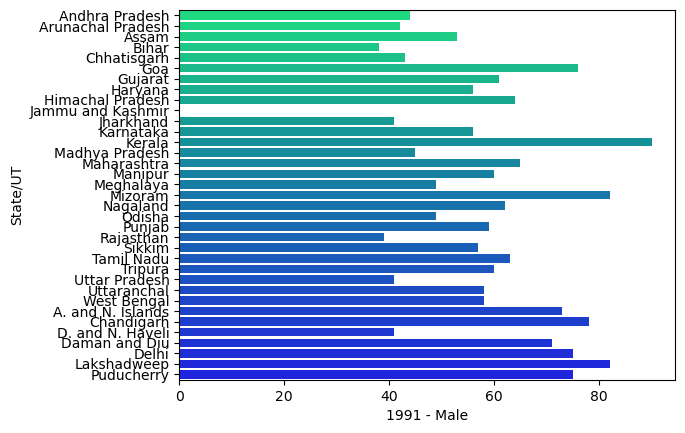

In [17]:
sns.barplot(x='1991 - Male', y='State/UT', data = df, palette='winter_r')
plt.show()

kerala has more male literacy rate in 1991

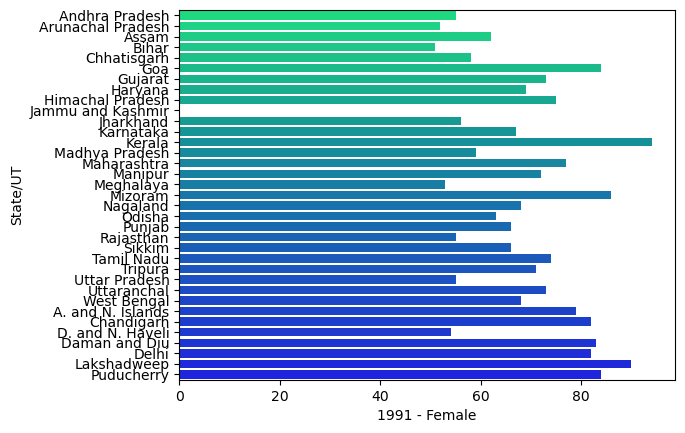

In [18]:
sns.barplot(x='1991 - Female', y='State/UT', data = df, palette='winter_r')
plt.show()

Female literacy rate is more in kerala and second last in Lakshadweep

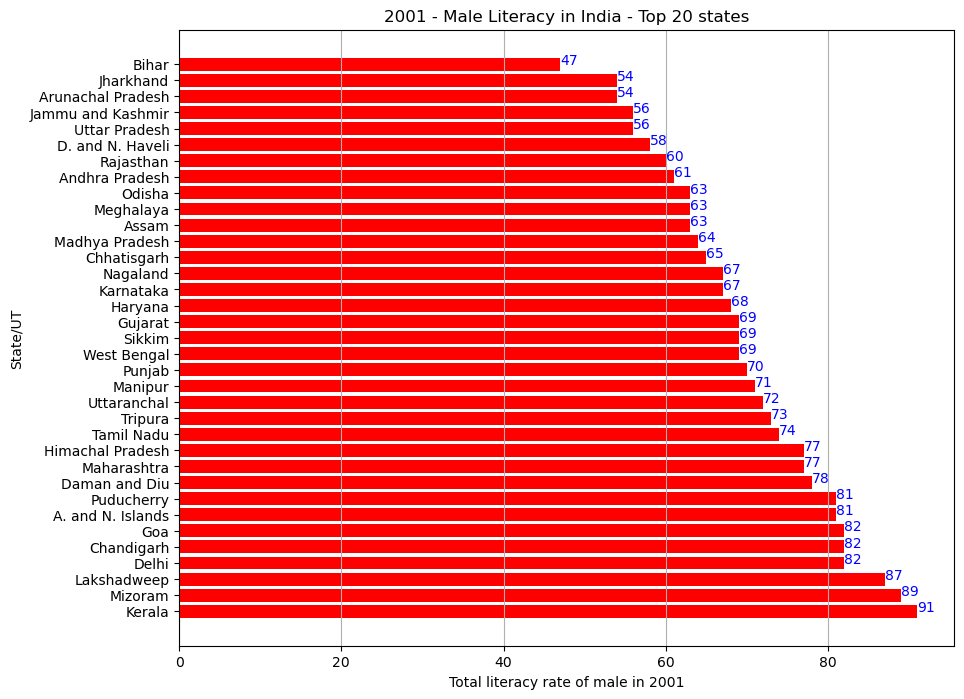

In [19]:
# Data manipulation 
selected_data = df[['State/UT', '2001 - Male']]
sorted_data = selected_data.sort_values('2001 - Male', ascending=False)

# Data visualization
plt.figure(figsize=(10, 8))
plt.barh(sorted_data['State/UT'], sorted_data['2001 - Male'], color='red')
for index, value in enumerate(sorted_data['2001 - Male']):
    plt.text(value, index, str(value), color='blue')

plt.title('2001 - Male Literacy in India - Top 20 states')
plt.xlabel('Total literacy rate of male in 2001')
plt.ylabel('State/UT')
plt.grid(axis='x')

plt.show()


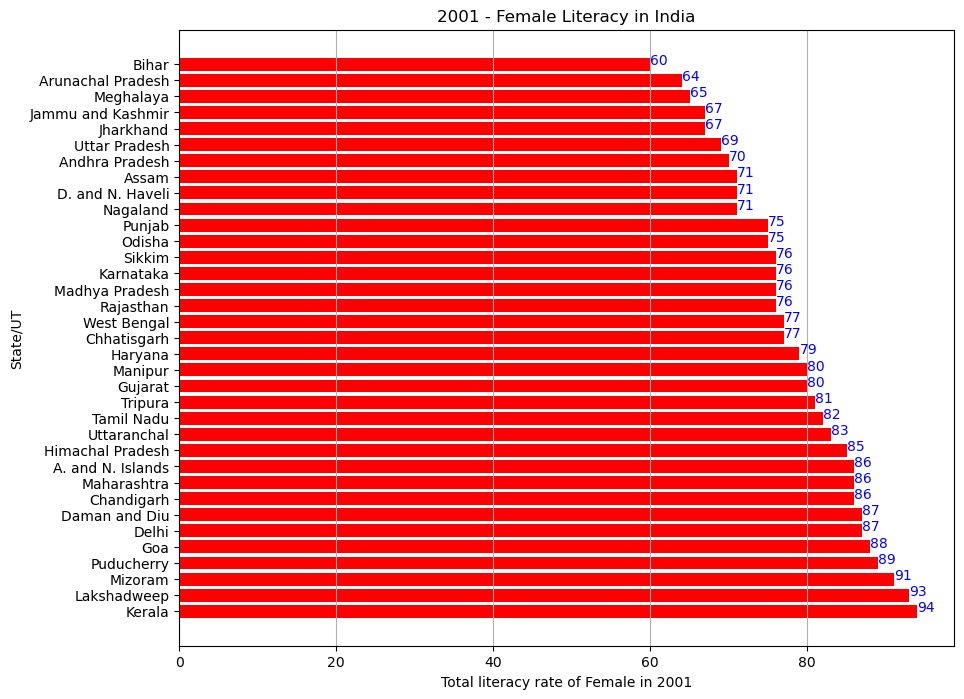

In [20]:
# Data manipulation 
selected_data = df[['State/UT', '2001 - Female']]
sorted_data = selected_data.sort_values('2001 - Female', ascending=False)

# Data visualization
plt.figure(figsize=(10, 8))
plt.barh(sorted_data['State/UT'], sorted_data['2001 - Female'], color='red')
for index, value in enumerate(sorted_data['2001 - Female']):
    plt.text(value, index, str(value), color='blue')

plt.title('2001 - Female Literacy in India')
plt.xlabel('Total literacy rate of Female in 2001')
plt.ylabel('State/UT')
plt.grid(axis='x')

plt.show()


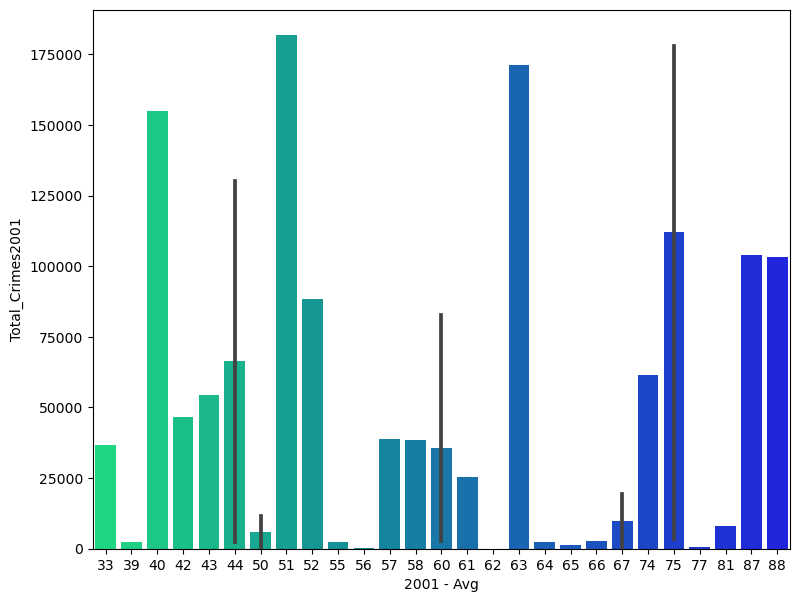

In [21]:
plt.figure(figsize=(9,7))
sns.barplot(x='2001 - Avg', y='Total_Crimes2001', data = df, palette='winter_r')
plt.show()


crimes are less where average literacy rate is high.
In some states has literacy rate is 63,51,75 there number of crimes are high.


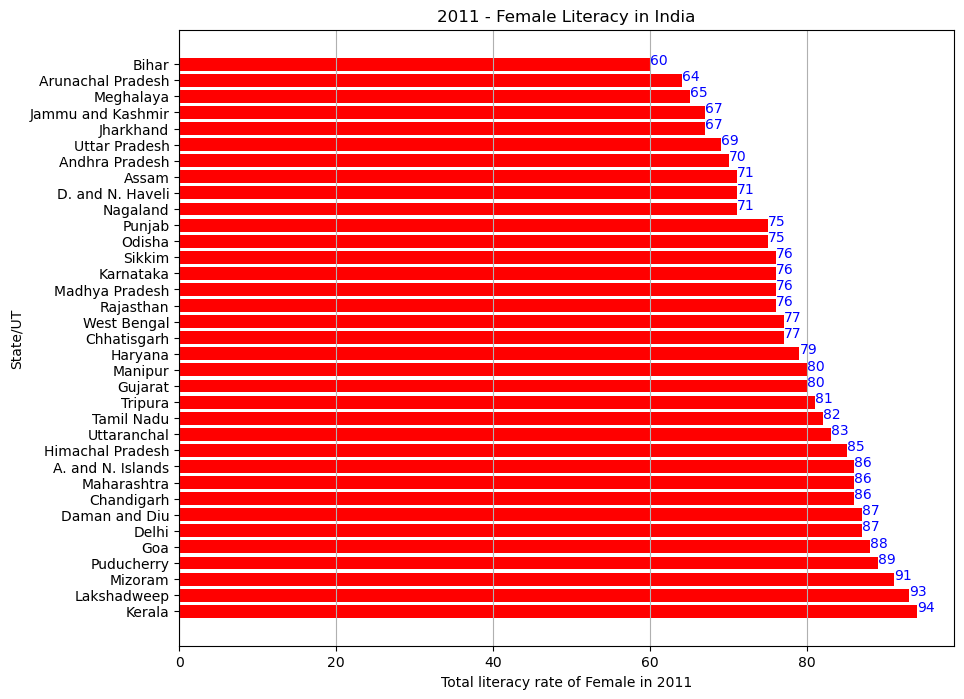

In [22]:
# Data manipulation 
selected_data = df[['State/UT', '2001 - Female']]
sorted_data = selected_data.sort_values('2001 - Female', ascending=False)

# Data visualization
plt.figure(figsize=(10, 8))
plt.barh(sorted_data['State/UT'], sorted_data['2001 - Female'], color='red')
for index, value in enumerate(sorted_data['2001 - Female']):
    plt.text(value, index, str(value), color='blue')

plt.title('2011 - Female Literacy in India')
plt.xlabel('Total literacy rate of Female in 2011')
plt.ylabel('State/UT')
plt.grid(axis='x')

plt.show()


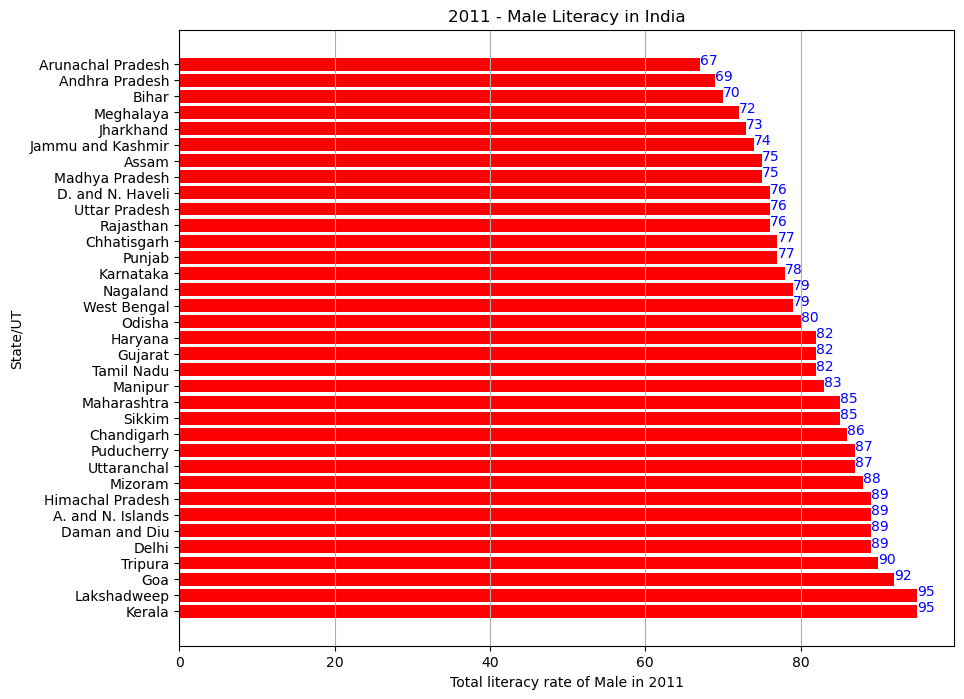

In [23]:
# Data manipulation 
selected_data = df[['State/UT', '2011 - Male']]
sorted_data = selected_data.sort_values('2011 - Male', ascending=False)

# Data visualization
plt.figure(figsize=(10, 8))
plt.barh(sorted_data['State/UT'], sorted_data['2011 - Male'], color='red')
for index, value in enumerate(sorted_data['2011 - Male']):
    plt.text(value, index, str(value), color='blue')

plt.title('2011 - Male Literacy in India')
plt.xlabel('Total literacy rate of Male in 2011')
plt.ylabel('State/UT')
plt.grid(axis='x')

plt.show()


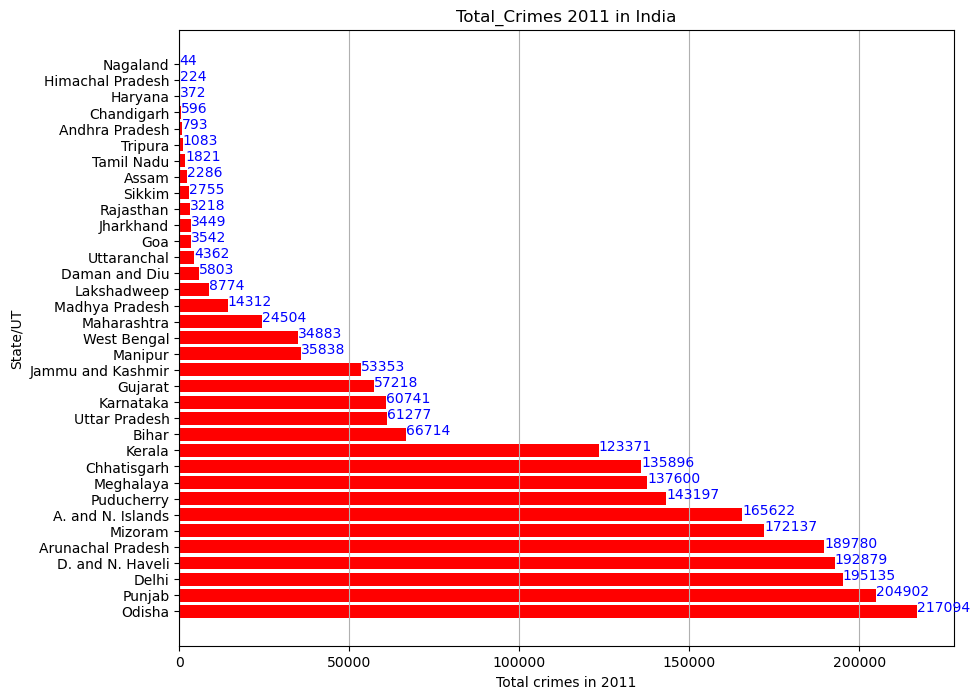

In [24]:
# Data manipulation 
selected_data = df[['State/UT', 'Total_Crimes2011']]
sorted_data = selected_data.sort_values('Total_Crimes2011', ascending=False)

# Data visualization
plt.figure(figsize=(10, 8))
plt.barh(sorted_data['State/UT'], sorted_data['Total_Crimes2011'], color='red')
for index, value in enumerate(sorted_data['Total_Crimes2011']):
    plt.text(value, index, str(value), color='blue')

plt.title('Total_Crimes 2011 in India')
plt.xlabel('Total crimes in 2011')
plt.ylabel('State/UT')
plt.grid(axis='x')

plt.show()


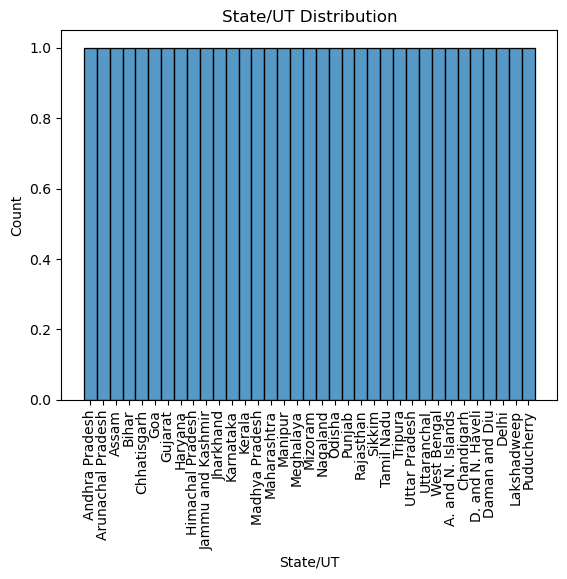

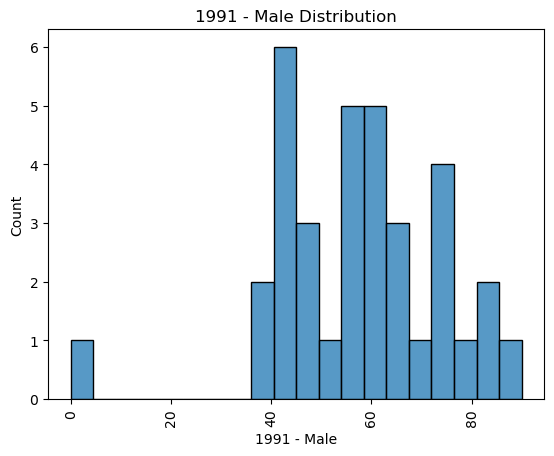

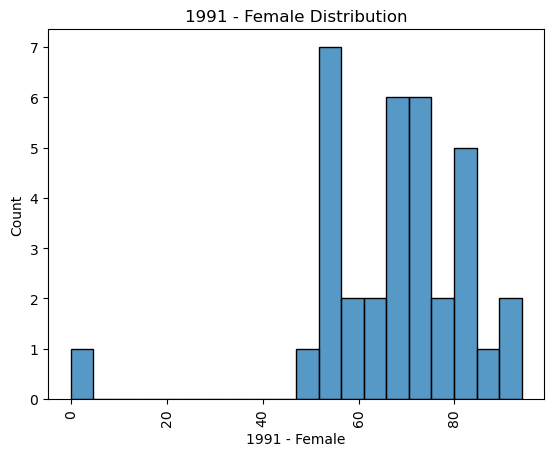

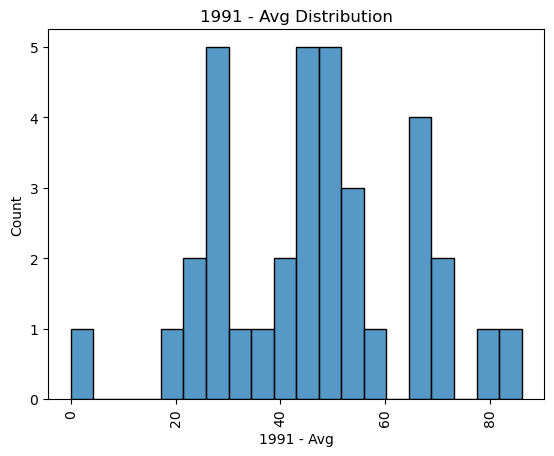

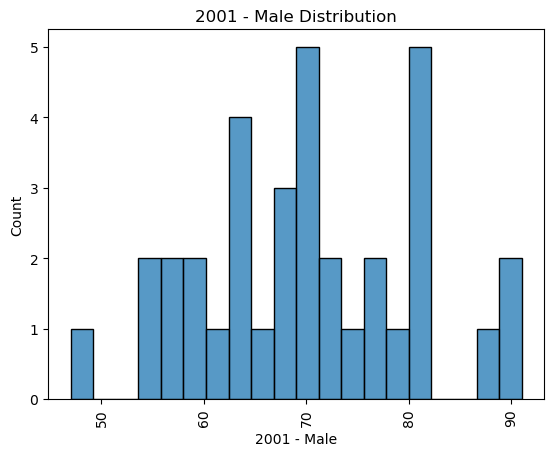

...

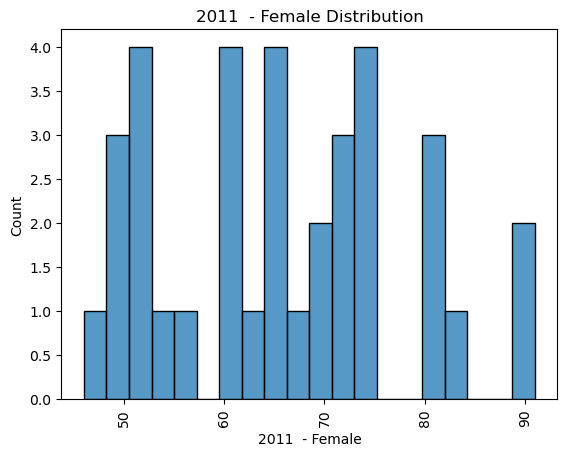

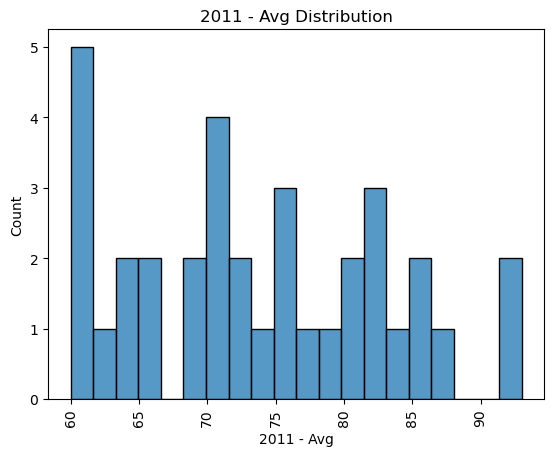

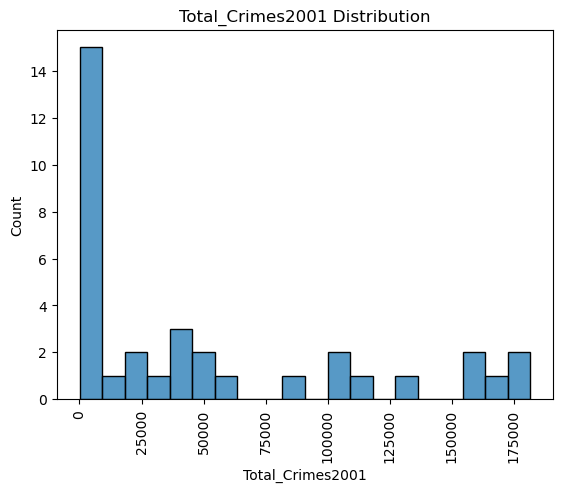

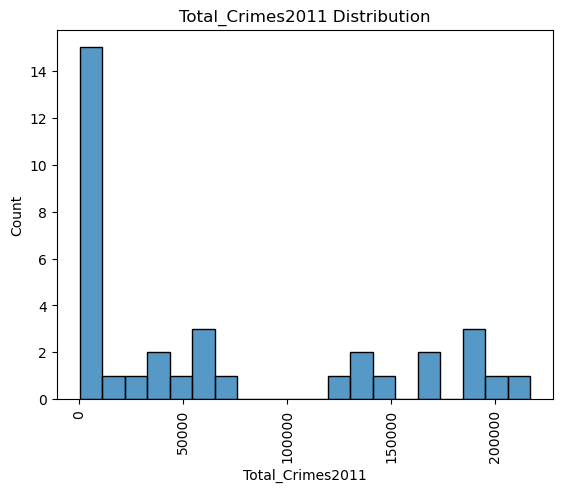

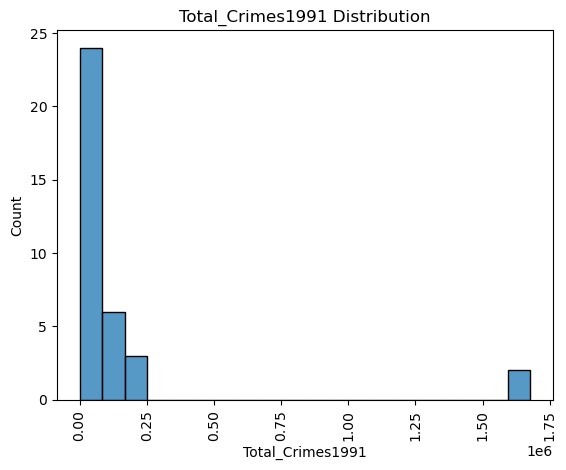

In [25]:
for i in df.columns:
    sns.histplot(x=i,data=df,kde=False,bins=20)
    plt.title(f'{i} Distribution')
    plt.xlabel(i)
    plt.ylabel('Count')
    plt.xticks(rotation=90)
    plt.show()
#


In [26]:

# checking categorical
cat_col = []
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        cat_col.append(i)
print('cat_col:',cat_col)

# checking Numerical
num_col = []
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        num_col.append(i)
print('num col:',num_col)

cat_col: ['State/UT']
num col: ['1991 - Male', '1991 - Female', '1991 - Avg', '2001 - Male', '2001 - Female', '2001 - Avg', '2011 - Male', '2011  - Female', '2011 - Avg', 'Total_Crimes2001', 'Total_Crimes2011', 'Total_Crimes1991']


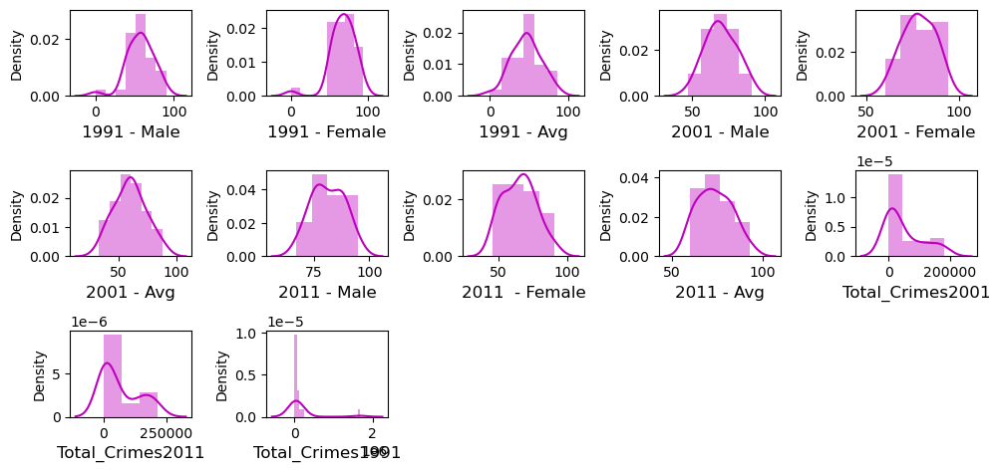

In [27]:
plt.figure(figsize = (10,6),facecolor = 'white')
plotnumber = 1
for col in num_col:
    if plotnumber<=13:
        ax = plt.subplot(4,5,plotnumber)#2 col,2 rows
        sns.distplot(df[col],color ='m')
        plt.xlabel(col,fontsize=12)
        plt.yticks(rotation = 0, fontsize= 10)
    plotnumber+=1
plt.tight_layout()

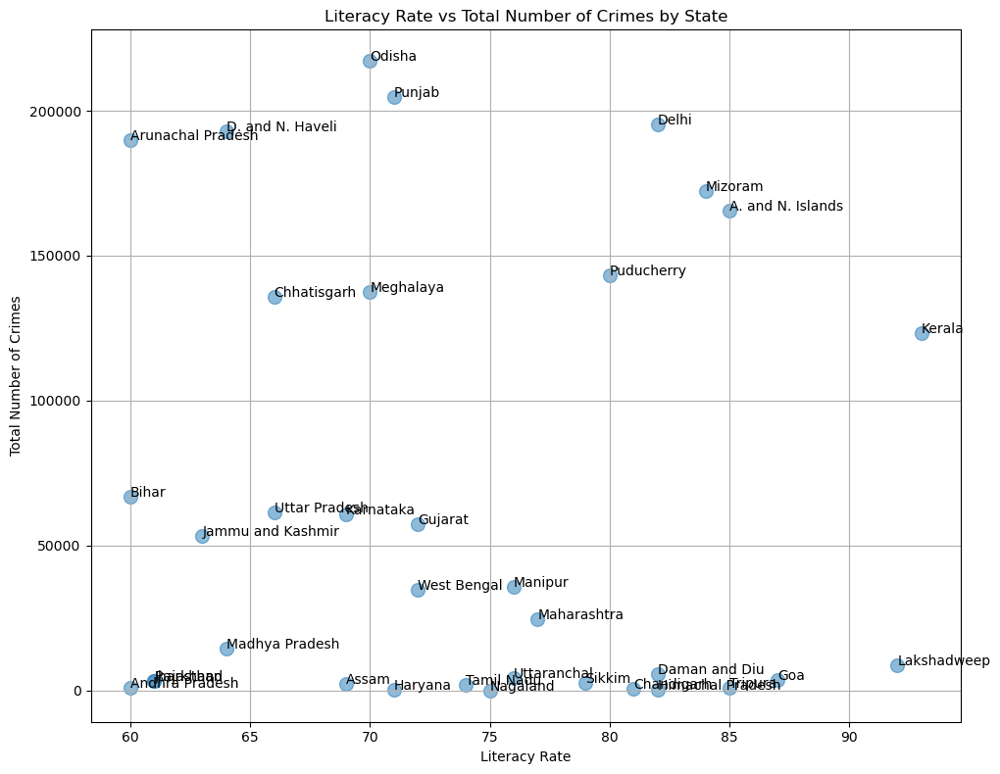

In [28]:
# Scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(df['2011 - Avg'], df['Total_Crimes2011'], s=100, alpha=0.5)
plt.title('Literacy Rate vs Total Number of Crimes by State')
plt.xlabel('Literacy Rate')
plt.ylabel('Total Number of Crimes')
plt.grid(True)
plt.tight_layout()

# Annotate points with state names (optional)
for i, txt in enumerate(df['State/UT']):
    plt.annotate(txt, (df['2011 - Avg'][i], df['Total_Crimes2011'][i]))

plt.show()

literacy rate high with lower number of crimes in lakshadweep,goa,diu daman,tripura.

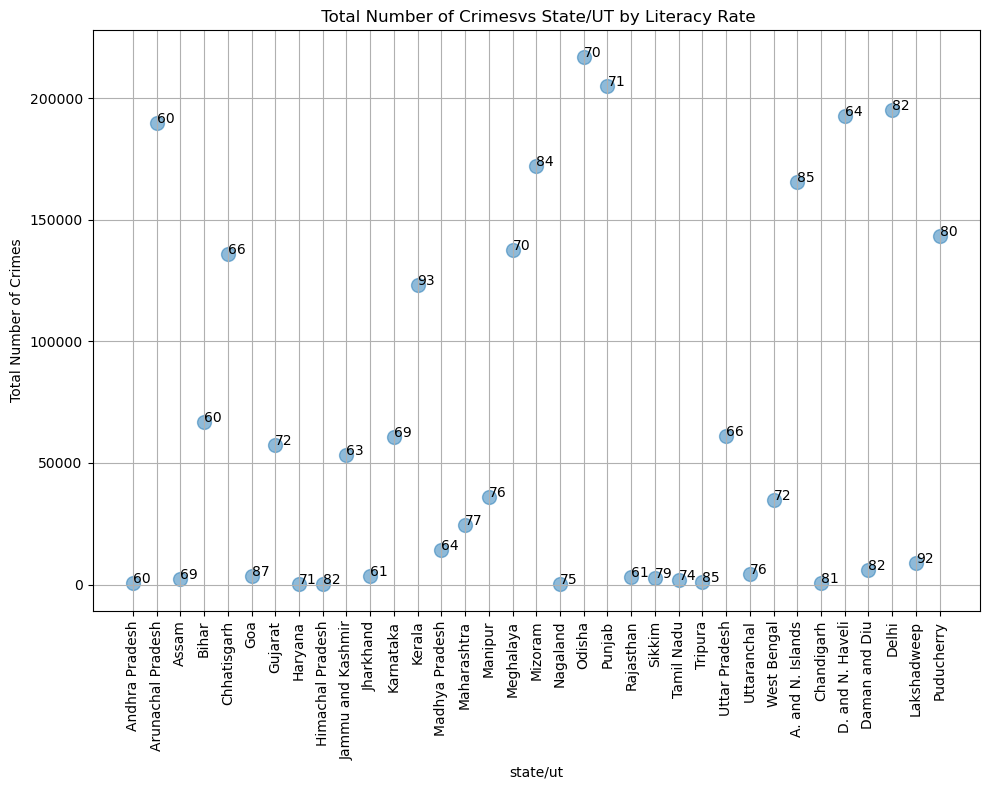

In [29]:
# Scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(df['State/UT'], df['Total_Crimes2011'], s=100, alpha=0.5)
plt.title(' Total Number of Crimesvs State/UT by Literacy Rate')
plt.xlabel('state/ut')
plt.ylabel('Total Number of Crimes')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()

# Annotate points with state names (optional)
for i, txt in enumerate(df['2011 - Avg']):
    plt.annotate(txt, (df['State/UT'][i], df['Total_Crimes2011'][i]))

plt.show()

In [30]:
# to understand the distribution of data
df.skew()

1991 - Male        -0.785367
1991 - Female      -1.793239
1991 - Avg         -0.060715
2001 - Male         0.070389
2001 - Female      -0.114730
2001 - Avg          0.119794
2011 - Male         0.012870
2011  - Female      0.211135
2011 - Avg          0.234263
Total_Crimes2001    1.048882
Total_Crimes2011    0.802278
Total_Crimes1991    3.809706
dtype: float64

highly positively skewed data showed in feature 'Total_Crimes1991'.
Moderately positive skewed data with feature 'Total_Crimes2001'.


In [31]:
cor = df.corr()
cor

,1991 - Male,1991 - Female,1991 - Avg,2001 - Male,2001 - Female,2001 - Avg,2011 - Male,2011 - Female,2011 - Avg,Total_Crimes2001,Total_Crimes2011,Total_Crimes1991
1991 - Male,1.000000,0.974158,0.975730,0.895190,0.836953,0.896421,0.803539,0.848853,0.859755,0.014828,0.032210,0.001495
1991 - Female,0.974158,1.000000,0.902463,0.823918,0.814428,0.797574,0.770533,0.752126,0.785660,-0.041540,-0.017064,0.023205
1991 - Avg,0.975730,0.902463,1.000000,0.925624,0.824633,0.952218,0.802934,0.906328,0.894635,0.068910,0.080692,-0.025320
2001 - Male,0.895190,0.823918,0.925624,1.000000,0.958022,0.980023,0.907430,0.900148,0.930520,0.024381,0.021883,-0.031762
2001 - Female,0.836953,0.814428,0.824633,0.958022,1.000000,0.886476,0.928767,0.794140,0.874038,-0.044987,-0.042021,0.022675
2001 - Avg,0.896421,0.797574,0.952218,0.980023,0.886476,1.000000,0.849485,0.932390,0.924803,0.061626,0.062996,-0.042252
2011 - Male,0.803539,0.770533,0.802934,0.907430,0.928767,0.849485,1.000000,0.880041,0.957301,-0.075837,-0.101426,0.003418
2011 - Female,0.848853,0.752126,0.906328,0.900148,0.794140,0.932390,0.880041,1.000000,0.977342,0.014926,-0.003355,-0.052473
2011 - Avg,0.859755,0.785660,0.894635,0.930520,0.874038,0.924803,0.957301,0.977342,1.000000,-0.018013,-0.040462,-0.025141
Total_Crimes2001,0.014828,-0.041540,0.068910,0.024381,-0.044987,0.061626,-0.075837,0.014926,-0.018013,1.000000,0.974960,0.000083


# 2.2]:Analysis of the type of crime vs each state vs Literacy rate.

In [32]:
df1 = pd.read_csv('C:\\Users\\SNEHAL\\Downloads\\Capstone-Project-File\\Statewise_Crime(2001&2011).csv')
df1
#(literacy rate,type of crime,state)

,State/Union Territory,2001,2011,lr_2001,lr_2011,Type_of_crime,Total_Crime2001,Total_CrimeRate2001,Total_Crime2011,Total_CrimeRate2011
0,Andaman and Nicobar Islands,359,502,81.300,86.60,Murder,658,184.8,793,208.7
1,Andhra Pradesh,76542,85188,60.470,67.00,Attempt to Commit Murder,130089,171.8,189780,224.2
2,Arunachal Pradesh,1110,1249,54.340,65.40,C H Not amounting to Murder,2342,214.7,2286,165.3
3,Assam,26873,30791,63.250,72.20,Rape,36877,138.4,66714,214.0
4,Bihar,84385,98505,47.000,61.80,Custodial Rape,88432,106.7,135896,130.9
5,Chandigarh,921,1480,81.940,86.00,Other Rape,3397,377.0,3542,335.7
6,Chhattisgarh,20969,24452,64.660,70.30,Kidnapping & Abduction,38460,184.9,57218,224.0
7,Delhi,228,364,81.670,86.20,K & A of Women and Girls,350,159.1,372,108.5
8,Goa,164,277,82.010,88.70,K & A of others,239,151.3,224,92.2
9,Gujarat,14150,18758,69.140,78.00,Dacoity,54384,394.6,53353,318.5


1.column name '2001','2011'  showing population of each state in that year.
2.lr_2001,lr_2011 showing literacy rate in 2001 and 2011. 
3.data collected according to 2001,2011 census.

In [33]:
df1.shape

(35, 10)

In [34]:
df1.columns

Index(['State/Union Territory', '2001', '2011', 'lr_2001', 'lr_2011',
       'Type_of_crime', 'Total_Crime2001', 'Total_CrimeRate2001',
       'Total_Crime2011', 'Total_CrimeRate2011'],
      dtype='object')

In [35]:
df1.dtypes

State/Union Territory     object
2001                       int64
2011                       int64
lr_2001                  float64
lr_2011                  float64
Type_of_crime             object
Total_Crime2001            int64
Total_CrimeRate2001      float64
Total_Crime2011            int64
Total_CrimeRate2011      float64
dtype: object

In [36]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35 entries, 0 to 34
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   State/Union Territory  35 non-null     object 
 1   2001                   35 non-null     int64  
 2   2011                   35 non-null     int64  
 3   lr_2001                35 non-null     float64
 4   lr_2011                35 non-null     float64
 5   Type_of_crime          35 non-null     object 
 6   Total_Crime2001        35 non-null     int64  
 7   Total_CrimeRate2001    35 non-null     float64
 8   Total_Crime2011        35 non-null     int64  
 9   Total_CrimeRate2011    35 non-null     float64
dtypes: float64(4), int64(4), object(2)
memory usage: 2.9+ KB


In [37]:
df1.isnull().sum()

State/Union Territory    0
2001                     0
2011                     0
lr_2001                  0
lr_2011                  0
Type_of_crime            0
Total_Crime2001          0
Total_CrimeRate2001      0
Total_Crime2011          0
Total_CrimeRate2011      0
dtype: int64

In [38]:
df1.describe()

,2001,2011,lr_2001,lr_2011,Total_Crime2001,Total_CrimeRate2001,Total_Crime2011,Total_CrimeRate2011
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,29705.771429,34337.371429,69.526143,77.667143,50551.657143,180.488571,66445.000000,190.500000
std,37897.053682,44416.163090,10.486244,8.463685,60908.926327,95.334269,76231.508059,95.583982
min,61.000000,76.000000,47.000000,61.800000,36.000000,59.000000,44.000000,54.700000
25%,1235.000000,1639.500000,63.165000,71.250000,2341.500000,105.450000,2986.500000,113.450000
50%,14150.000000,18758.000000,68.640000,76.900000,25447.000000,174.200000,34883.000000,182.300000
75%,52335.000000,59632.500000,76.680000,84.300000,95925.500000,210.800000,136748.000000,230.850000
max,168451.000000,202830.000000,90.860000,94.000000,181741.000000,417.700000,217094.000000,515.600000


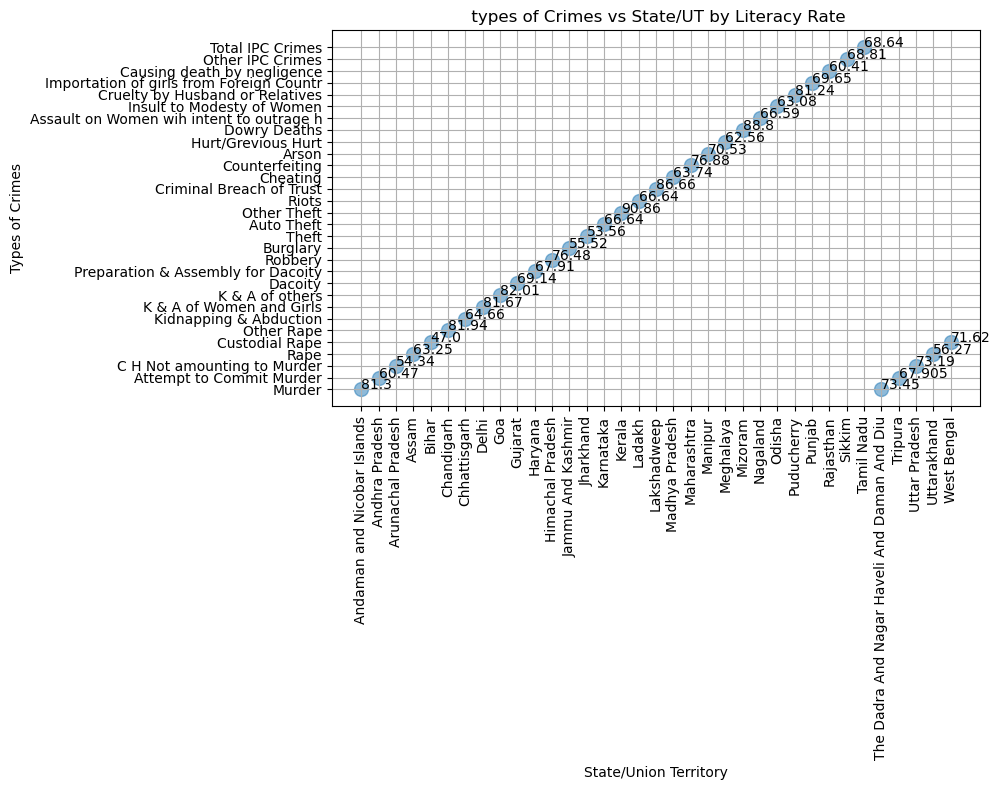

In [39]:
# Scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(df1['State/Union Territory'], df1['Type_of_crime'], s=100, alpha=0.5)
plt.title(' types of Crimes vs State/UT by Literacy Rate')
plt.xlabel('State/Union Territory')
plt.ylabel('Types of Crimes')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()

# Annotate points with state names (optional)
for i, txt in enumerate(df1['lr_2001']):
    plt.annotate(txt, (df1['State/Union Territory'][i], df1['Type_of_crime'][i]))

plt.show()

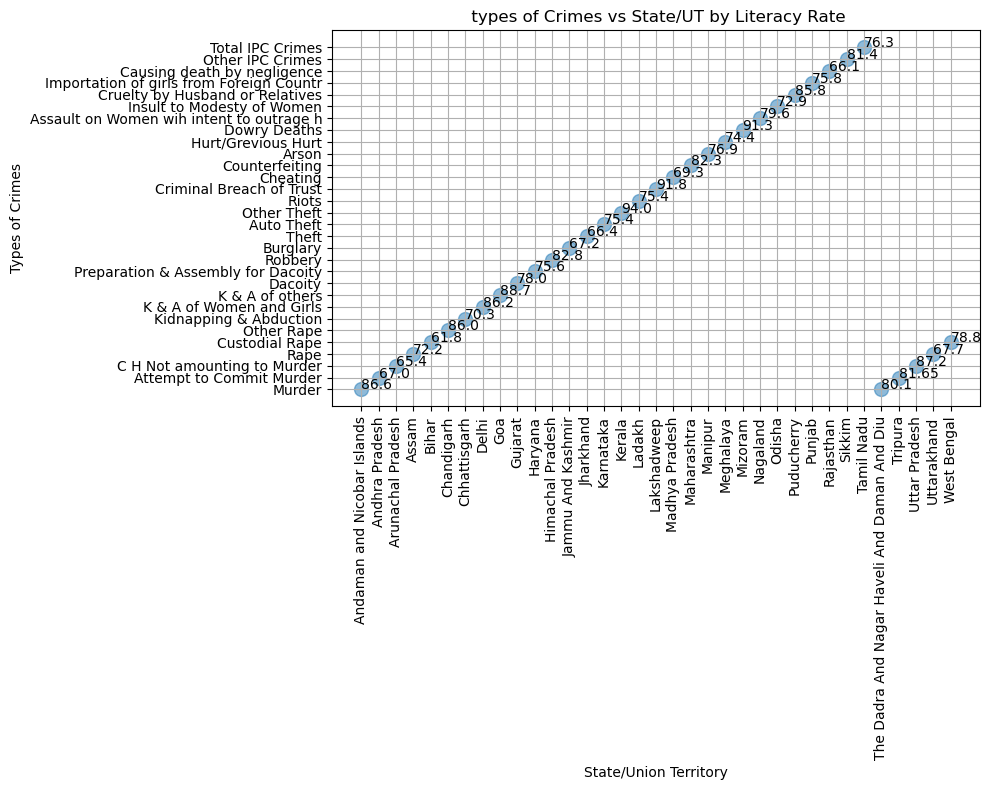

In [40]:
# Scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(df1['State/Union Territory'], df1['Type_of_crime'], s=100, alpha=0.5)
plt.title(' types of Crimes vs State/UT by Literacy Rate')
plt.xlabel('State/Union Territory')
plt.ylabel('Types of Crimes')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()

# Annotate points with state names (optional)
for i, txt in enumerate(df1['lr_2011']):
    plt.annotate(txt, (df1['State/Union Territory'][i], df1['Type_of_crime'][i]))

plt.show()

# Top 10 State with crime rate and Litracy rate in 2001 and 2011

In [41]:
# top 10 state with crime rate in 2001
def pie_chart_highest(df1, nam_feature):
    data= df1.sort_values(by=nam_feature, ascending=False)
    fig = px.pie(data[:10], values=nam_feature, names='State/Union Territory',
                 title='Top 10 States with the Highest '+nam_feature, 
                 color_discrete_sequence=px.colors.sequential.Purp_r)
    fig.show()

In [42]:
pie_chart_highest(df1, 'Total_CrimeRate2001')

highest crime rate in 2001 in punjab state.

In [43]:
pie_chart_highest(df1, 'lr_2001')

In 2001 having highest  literacy rate in Kerala and lowest literacy rate in himachal pradesh.


In [44]:
pie_chart_highest(df1, 'lr_2011')

If you mouse hover on chart, will know that the highest literacy rate in kerala with 9.4% and lowest rate in himachal pradesh.

In [45]:
pie_chart_highest(df1, 'Total_CrimeRate2011')

In [46]:
# correlation between features
cor = df1.corr()
cor

,2001,2011,lr_2001,lr_2011,Total_Crime2001,Total_CrimeRate2001,Total_Crime2011,Total_CrimeRate2011
2001,1.000000,0.999025,-0.023767,0.045715,0.837353,-0.074368,0.846994,0.034366
2011,0.999025,1.000000,-0.024591,0.050273,0.832963,-0.071161,0.836045,0.026499
lr_2001,-0.023767,-0.024591,1.000000,0.958834,-0.001608,0.148611,-0.000660,0.201405
lr_2011,0.045715,0.050273,0.958834,1.000000,0.043087,0.138789,0.026109,0.172200
Total_Crime2001,0.837353,0.832963,-0.001608,0.043087,1.000000,0.225639,0.974960,0.316225
Total_CrimeRate2001,-0.074368,-0.071161,0.148611,0.138789,0.225639,1.000000,0.185811,0.848850
Total_Crime2011,0.846994,0.836045,-0.000660,0.026109,0.974960,0.185811,1.000000,0.355764
Total_CrimeRate2011,0.034366,0.026499,0.201405,0.172200,0.316225,0.848850,0.355764,1.000000


# 2.4]:Analysis of area vs overall crime.

Getting Idea from https://www.kaggle.com/datasets.

In [47]:
df2 = pd.read_csv('C:\\Users\\SNEHAL\\Downloads\\Capstone-Project-File\\01_District_wise_crimes_committed_IPC_2001_2012.csv')
df2

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,41,1244,12,109,58,247,0,431,2313,6507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9014,PUDUCHERRY,KARAIKAL,2012,5,6,2,6,0,6,2,...,1,186,0,2,0,1,0,44,392,787
9015,PUDUCHERRY,PUDUCHERRY,2012,24,21,10,7,0,7,17,...,20,632,0,7,2,5,0,219,1668,3494


1.state and district wise overall crimes 
2.In this dataset head of crimes are mentioned with total count in every year (2001 to 2012)
3.district wise number of crimes happed in every year.
4.But we have to analyze data state wise not District wise.
5.Here we can see data state wise also district wise.
6.We consider District as Area of state where crimes had done and get count of crimes.

In [48]:
df2.shape

(9017, 33)

In [49]:
df2.columns

Index(['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES'],
      dtype='object')

In [50]:
df2.isnull().sum()

STATE/UT                                               0
DISTRICT                                               0
YEAR                                                   0
MURDER                                                 0
ATTEMPT TO MURDER                                      0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              0
RAPE                                                   0
CUSTODIAL RAPE                                         0
OTHER RAPE                                             0
KIDNAPPING & ABDUCTION                                 0
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS            0
KIDNAPPING AND ABDUCTION OF OTHERS                     0
DACOITY                                                0
PREPARATION AND ASSEMBLY FOR DACOITY                   0
ROBBERY                                                0
BURGLARY                                               0
THEFT                                                  0
AUTO THEFT                     

In [51]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9017 entries, 0 to 9016
Data columns (total 33 columns):
 #   Column                                               Non-Null Count  Dtype 
---  ------                                               --------------  ----- 
 0   STATE/UT                                             9017 non-null   object
 1   DISTRICT                                             9017 non-null   object
 2   YEAR                                                 9017 non-null   int64 
 3   MURDER                                               9017 non-null   int64 
 4   ATTEMPT TO MURDER                                    9017 non-null   int64 
 5   CULPABLE HOMICIDE NOT AMOUNTING TO MURDER            9017 non-null   int64 
 6   RAPE                                                 9017 non-null   int64 
 7   CUSTODIAL RAPE                                       9017 non-null   int64 
 8   OTHER RAPE                                           9017 non-null   int64 
 9

In [52]:
df2.describe()

,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
count,9017.000000,9017.00000,9017.000000,9017.000000,9017.000000,9017.000000,9017.000000,9017.000000,9017.000000,9017.000000,...,9017.000000,9017.000000,9017.000000,9017.000000,9017.000000,9017.000000,9017.000000,9017.000000,9017.000000,9017.000000
mean,2006.629034,89.28535,78.069646,9.895531,53.041366,0.005767,53.035599,79.152046,58.535433,20.616613,...,25.219918,747.893091,20.228901,100.511257,27.515582,194.122435,0.197849,222.216702,2174.299434,5310.115116
std,3.463623,327.27503,303.446020,59.521657,190.741450,0.115223,190.725474,317.630964,246.937464,88.586415,...,98.880282,3024.106467,96.970466,394.059436,167.237522,831.986594,2.415039,936.002540,7988.438462,18524.381119
min,2001.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2004.000000,18.00000,10.000000,0.000000,8.000000,0.000000,8.000000,10.000000,6.000000,1.000000,...,2.000000,43.000000,1.000000,10.000000,0.000000,11.000000,0.000000,5.000000,265.000000,853.000000
50%,2007.000000,38.00000,28.000000,2.000000,20.000000,0.000000,20.000000,25.000000,18.000000,5.000000,...,8.000000,199.000000,5.000000,31.000000,2.000000,47.000000,0.000000,68.000000,745.000000,2096.000000
75%,2010.000000,66.00000,56.000000,6.000000,41.000000,0.000000,41.000000,56.000000,42.000000,13.000000,...,20.000000,529.000000,16.000000,76.000000,13.000000,135.000000,0.000000,177.000000,1608.000000,3972.000000
max,2012.000000,7601.00000,7964.000000,1616.000000,3425.000000,5.000000,3425.000000,8878.000000,7910.000000,2416.000000,...,2830.000000,56768.000000,2322.000000,7118.000000,4970.000000,19865.000000,83.000000,16076.000000,124176.000000,220335.000000


For doing visualizations we are creating a dataframe with State name and total number of cases on that state.

In [53]:
total = df2[(df2['DISTRICT']=='TOTAL')]
total

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
28,ANDHRA PRADESH,TOTAL,2001,2602,1555,136,871,0,871,1182,...,872,34947,420,3544,2271,5791,7,7400,34344,130089
42,ARUNACHAL PRADESH,TOTAL,2001,83,53,3,33,0,33,83,...,13,466,0,78,3,11,0,0,618,2342
70,ASSAM,TOTAL,2001,1356,481,40,817,0,817,1480,...,441,5805,59,850,4,1248,0,2010,9315,36877
115,BIHAR,TOTAL,2001,3643,3419,250,888,0,888,2159,...,502,7544,859,562,21,1558,83,2406,36667,88432
135,CHHATTISGARH,TOTAL,2001,880,529,45,959,0,959,207,...,215,5477,70,1763,161,840,0,689,15790,38460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8988,CHANDIGARH,TOTAL,2012,21,44,5,27,0,27,87,...,9,42,5,45,25,73,0,3,1042,3606
8990,D & N HAVELI,TOTAL,2012,7,2,0,3,0,3,13,...,12,25,0,2,0,0,0,23,112,318
8993,DAMAN & DIU,TOTAL,2012,3,5,0,5,0,5,3,...,11,17,0,0,0,3,0,38,46,239
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60


In [54]:
# Convert DataFrame to CSV
total.to_csv('C:\\Users\\SNEHAL\\Downloads\\Capstone-Project-File\\statewise_overall_crimes.csv', index=False)

# Andhrapradesh

In [55]:
andhra = total[(total['STATE/UT']=='ANDHRA PRADESH')]
andhra

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
28,ANDHRA PRADESH,TOTAL,2001,2602,1555,136,871,0,871,1182,...,872,34947,420,3544,2271,5791,7,7400,34344,130089
744,ANDHRA PRADESH,TOTAL,2002,2525,1644,165,1002,0,1002,1302,...,991,39839,449,3799,2024,7018,0,8691,36385,143610
1464,ANDHRA PRADESH,TOTAL,2003,2667,1678,147,946,0,946,1485,...,1049,41545,466,4128,2286,8167,5,8515,39242,156951
2192,ANDHRA PRADESH,TOTAL,2004,2579,1908,163,1016,0,1016,1526,...,915,43335,512,3817,2310,8388,2,11452,36460,158756
2921,ANDHRA PRADESH,TOTAL,2005,2750,1724,111,935,1,934,1612,...,967,42179,443,3595,2508,8696,3,9973,37707,157123
3654,ANDHRA PRADESH,TOTAL,2006,2766,1860,123,1049,1,1048,2030,...,1012,47946,519,4534,2411,9164,0,11489,43722,173909
4394,ANDHRA PRADESH,TOTAL,2007,2665,1885,135,1070,0,1070,2097,...,1176,46122,613,4406,3316,11335,0,12629,43586,175087
5137,ANDHRA PRADESH,TOTAL,2008,2690,1942,165,1257,0,1257,1970,...,1021,48167,556,4730,3551,10306,0,12861,43929,179275
5898,ANDHRA PRADESH,TOTAL,2009,2449,1859,134,1188,0,1188,1958,...,1039,44488,546,5147,3520,11297,0,13438,48087,180441
6669,ANDHRA PRADESH,TOTAL,2010,2538,1953,155,1362,0,1362,2053,...,925,46777,588,4634,4562,12080,0,14085,41373,181438


Note that in the 28th row, district name Total is there with sum of all the number of cases reported that year,
Like the same there are Total elements for every state for every year

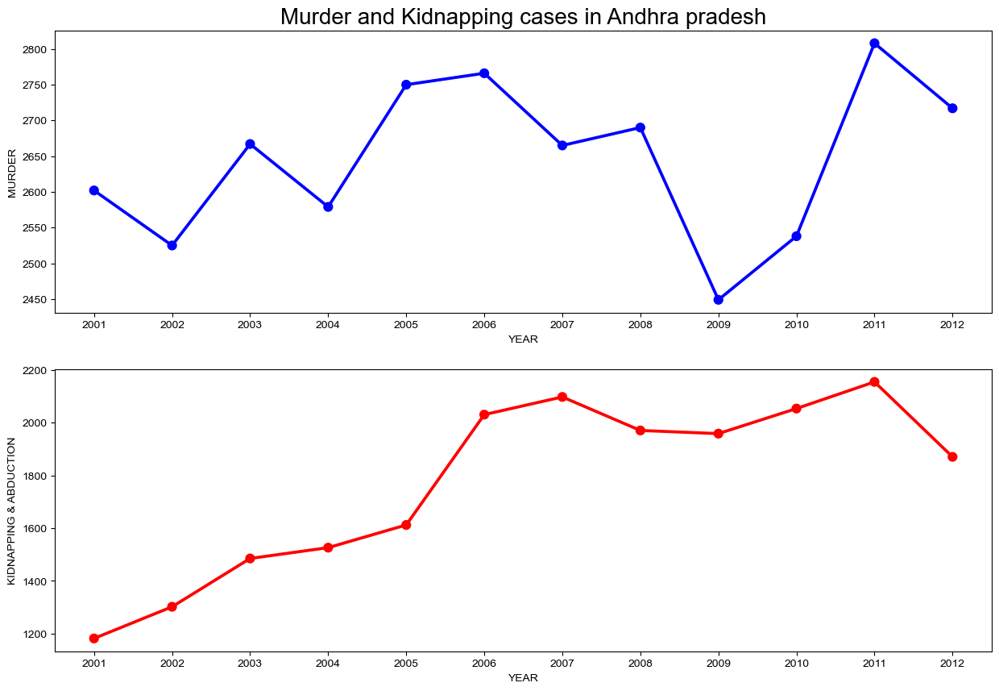

In [56]:
fig, (ax_0, ax_1) = plt.subplots(figsize=(15,10), nrows=2)
sns.pointplot(data=andhra, x='YEAR', y="MURDER", ax=ax_0, color="blue");
sns.pointplot(data=andhra, x='YEAR', y="KIDNAPPING & ABDUCTION", ax=ax_1, color="red");
ax_0.set_title("Murder and Kidnapping cases in Andhra pradesh", size=20);
sns.set_theme(style="dark")

Murders and Kidnapping cases increases every year as per graph.
we can see that only in 2009 and 2010 count of murders decreases in andhrapradesh.

# Tamilnadu

In [57]:
tamilnadu = total[(total["STATE/UT"] == "TAMIL NADU")]
tamilnadu.head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
573,TAMIL NADU,TOTAL,2001,1662,2204,19,423,0,423,952,...,980,28429,191,1773,1012,815,14,8550,76468,154801
1289,TAMIL NADU,TOTAL,2002,1723,2133,36,534,0,534,1001,...,850,25150,243,1877,1718,1052,0,10125,88680,166942
2018,TAMIL NADU,TOTAL,2003,1591,1843,28,557,1,556,879,...,791,30228,220,2022,881,1555,1,9112,77784,157186
2747,TAMIL NADU,TOTAL,2004,1479,1772,26,618,0,618,870,...,662,30855,225,1861,1081,1437,0,9152,88439,166606
3480,TAMIL NADU,TOTAL,2005,1440,1759,28,571,1,570,1029,...,495,31725,215,1764,665,1650,0,8902,86494,162360


Rape cases Reported in year(2002-2012) in state Tamilnadu

In [58]:
fig = px.bar(tamilnadu, x="YEAR", y="RAPE", color_discrete_sequence=["blue"], title="Rape cases in Tamil nadu")
fig.update_layout(xaxis_title = "Year",
                  yaxis_title = "Cases Reported")
fig.layout.template ="plotly_dark"
fig.show()

In [59]:
fig = px.bar(tamilnadu, x="YEAR", y="DACOITY", color_discrete_sequence=["blue"], title="DACOITY cases in Tamil nadu")
fig.update_layout(xaxis_title = "Year",
                  yaxis_title = "Cases Reported")
fig.layout.template ="plotly_dark"
fig.show()

Dacoity cases decreasing in year by year .
In year 2002 cases were high.

In [60]:
fig = px.bar(tamilnadu, x="YEAR", y="ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY", color_discrete_sequence=["blue"], title="Assault on women cases in Tamil nadu")
fig.update_layout(xaxis_title = "Year",
                  yaxis_title = "Cases Reported")
fig.layout.template ="plotly_dark"
fig.show()

# Bihar

In [61]:
bihar = total[(total["STATE/UT"] == "BIHAR")]
bihar.head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
115,BIHAR,TOTAL,2001,3643,3419,250,888,0,888,2159,...,502,7544,859,562,21,1558,83,2406,36667,88432
831,BIHAR,TOTAL,2002,3712,3526,396,1040,0,1040,2361,...,600,8770,927,621,6,1577,38,2497,39145,94040
1553,BIHAR,TOTAL,2003,3771,3540,298,985,0,985,2427,...,669,8884,909,688,11,1880,37,2574,37503,92263
2281,BIHAR,TOTAL,2004,3948,2995,280,1390,1,1389,3413,...,707,11231,1029,704,13,2679,35,2405,44178,108060
3013,BIHAR,TOTAL,2005,3471,3307,259,1147,0,1147,2693,...,760,11939,1014,451,13,1574,74,2680,40057,97850


In [62]:
bihar.shape

(12, 33)

In [63]:
fig = px.bar(bihar, x="YEAR", y="OTHER RAPE", color_discrete_sequence=["blue"], title="OTHER RAPE cases in Bihar")
fig.update_layout(xaxis_title = "Year",
                  yaxis_title = "Cases Reported")
fig.layout.template ="plotly_dark"
fig.show()

IN year 2007,there highest number of other rape case were reported .
Count of cases getting low in 2009 and 2012

In [64]:
fig = px.bar(bihar, x="YEAR", y="RIOTS", color_discrete_sequence=["blue"], title="RIOTS cases in Bihar")
fig.update_layout(xaxis_title = "Year",
                  yaxis_title = "Cases Reported")
fig.layout.template ="plotly_dark"
fig.show()

# Kerala

In [65]:
kerala = total[(total["STATE/UT"] == "KERALA")]
kerala.head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
302,KERALA,TOTAL,2001,472,615,111,562,0,562,183,...,768,19829,27,1942,81,2561,0,0,54544,103847
1019,KERALA,TOTAL,2002,454,562,210,499,0,499,162,...,452,19033,17,2123,102,2836,0,32,55094,104200
1745,KERALA,TOTAL,2003,435,448,343,394,0,394,189,...,413,17696,33,1947,68,2930,0,35,53487,98824
2473,KERALA,TOTAL,2004,417,391,473,480,0,480,232,...,374,20610,31,2260,133,3222,0,42,54106,104025
3207,KERALA,TOTAL,2005,388,341,88,478,0,478,226,...,456,18302,21,2339,175,3283,0,34,57530,104350


In [66]:
fig = px.bar(kerala, x="YEAR", y="KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS", color_discrete_sequence=["blue"], title="KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS cases in kerala")
fig.update_layout(xaxis_title = "Year",
                  yaxis_title = "Cases Reported")
fig.layout.template ="plotly_dark"
fig.show()

In [67]:
fig = px.bar(kerala, x="YEAR", y="DOWRY DEATHS", color_discrete_sequence=["blue"], title="DOWRY DEATHS cases in kerala")
fig.update_layout(xaxis_title = "Year",
                  yaxis_title = "Cases Reported")
fig.layout.template ="plotly_dark"
fig.show()

1]head of crime happend in keral from 2001 to 2012.
2]Above graph showing how many KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS and DOWRY DEATHS cases reported over year(2001-2012)

# Maharashtra

In [68]:
maha = total[(total['STATE/UT']=='MAHARASHTRA')]
maha

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
397,MAHARASHTRA,TOTAL,2001,2839,1454,101,1302,0,1302,985,...,1208,30212,308,2823,1120,6090,1,8993,42963,171233
1114,MAHARASHTRA,TOTAL,2002,2768,1435,93,1352,1,1351,953,...,1269,29250,303,2686,769,5353,0,9407,42643,165462
1843,MAHARASHTRA,TOTAL,2003,2772,1412,113,1268,0,1268,926,...,1188,29205,368,2661,682,5452,0,9378,42491,164306
2571,MAHARASHTRA,TOTAL,2004,2696,1463,115,1388,0,1388,1045,...,1149,30122,314,2831,862,5646,0,9574,44420,176302
3305,MAHARASHTRA,TOTAL,2005,2621,1614,98,1545,0,1545,1194,...,1123,30017,341,3228,919,6233,0,9608,47386,187027
4039,MAHARASHTRA,TOTAL,2006,2656,1680,100,1500,1,1499,1261,...,1188,29407,387,3479,984,6738,1,10933,49834,191788
4781,MAHARASHTRA,TOTAL,2007,2693,1615,113,1451,0,1451,1312,...,1267,29622,436,3306,1039,7356,0,11946,50159,195707
5531,MAHARASHTRA,TOTAL,2008,2795,1837,111,1558,0,1558,1379,...,1288,29742,390,3619,1091,7829,0,12472,50183,206243
6296,MAHARASHTRA,TOTAL,2009,2653,1880,98,1483,0,1483,1286,...,1105,28326,341,3196,1099,7681,0,12459,48460,199598
7071,MAHARASHTRA,TOTAL,2010,2744,1926,152,1599,0,1599,1508,...,1229,29696,393,3661,1180,7434,0,13508,49739,208168


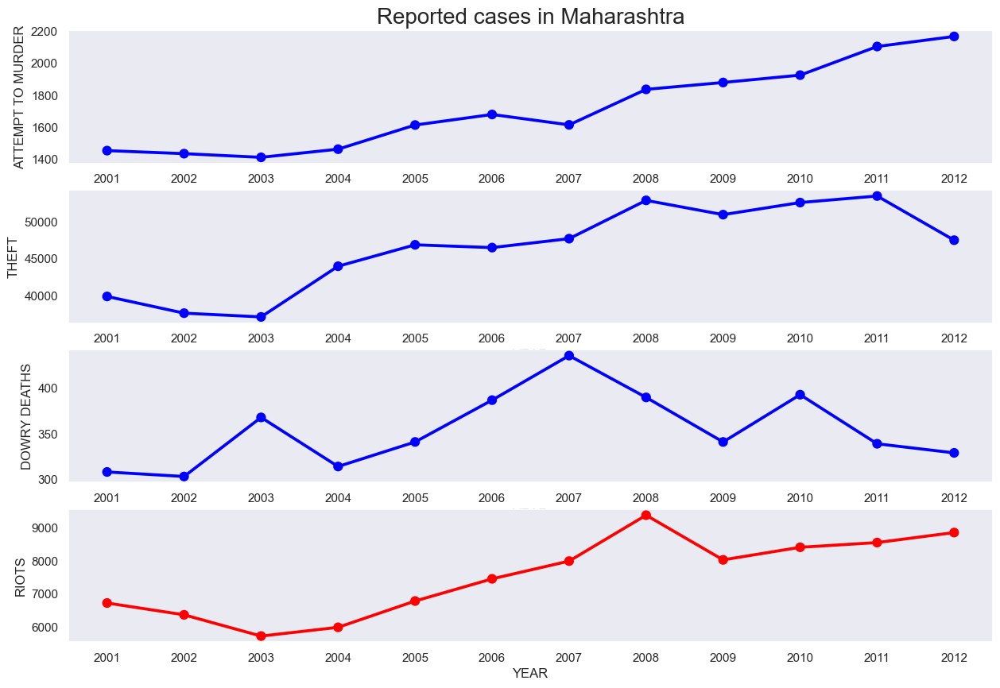

In [69]:
fig, (ax_0, ax_1,ax_2,ax_3) = plt.subplots(figsize=(15,10), nrows=4)
sns.pointplot(data=maha, x='YEAR', y="ATTEMPT TO MURDER", ax=ax_0, color="blue");
sns.pointplot(data=maha, x='YEAR', y="THEFT", ax=ax_1, color="blue");
sns.pointplot(data=maha, x='YEAR', y="DOWRY DEATHS", ax=ax_2, color="blue");
sns.pointplot(data=maha, x='YEAR', y="RIOTS", ax=ax_3, color="red");
ax_0.set_title("Reported cases in Maharashtra", size=20);
sns.set_theme(style="dark")

# Analyzing total number of cases reported all over india

In [70]:
m = pd.DataFrame(total.groupby(["STATE/UT"])["MURDER"].sum().reset_index())
m.head()

,STATE/UT,MURDER
0,A & N ISLANDS,160
1,ANDHRA PRADESH,31756
2,ARUNACHAL PRADESH,841
3,ASSAM,15432
4,BIHAR,41245


In [71]:
da = pd.DataFrame(total.groupby(["STATE/UT"])["DACOITY"].sum().reset_index())
da.columns = ["STATE/UT", "CASES REPORTED"]
da.head()

,STATE/UT,CASES REPORTED
0,A & N ISLANDS,15
1,ANDHRA PRADESH,1987
2,ARUNACHAL PRADESH,260
3,ASSAM,4170
4,BIHAR,11099


In [72]:
a = pd.DataFrame(total.groupby(["STATE/UT"])["ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY"].sum().reset_index())
a.columns = ["STATE/UT", "CASES REPORTED"]
a.head()

,STATE/UT,CASES REPORTED
0,A & N ISLANDS,214
1,ANDHRA PRADESH,51999
2,ARUNACHAL PRADESH,784
3,ASSAM,13620
4,BIHAR,7576


In [73]:
ra = pd.DataFrame(total.groupby(["STATE/UT"])["RAPE"].sum().reset_index())
ra.columns = ["STATE/UT", "CASES REPORTED"]
ra.head()

,STATE/UT,CASES REPORTED
0,A & N ISLANDS,109
1,ANDHRA PRADESH,13479
2,ARUNACHAL PRADESH,500
3,ASSAM,16178
4,BIHAR,13124


In [74]:
ri = pd.DataFrame(total.groupby(["STATE/UT"])["RIOTS"].sum().reset_index())
ri.columns = ["STATE/UT", "CASES REPORTED"]
ri.head()

,STATE/UT,CASES REPORTED
0,A & N ISLANDS,140
1,ANDHRA PRADESH,27459
2,ARUNACHAL PRADESH,340
3,ASSAM,34963
4,BIHAR,105096


In [75]:
im = pd.DataFrame(total.groupby(["STATE/UT"])["IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES"].sum().reset_index())
im.columns = ["STATE/UT", "CASES REPORTED"]
im.head()

,STATE/UT,CASES REPORTED
0,A & N ISLANDS,0
1,ANDHRA PRADESH,17
2,ARUNACHAL PRADESH,0
3,ASSAM,8
4,BIHAR,440


In [76]:
ka = pd.DataFrame(total.groupby(["STATE/UT"])["KIDNAPPING & ABDUCTION"].sum().reset_index())
ka.columns = ["STATE/UT", "CASES REPORTED"]
ka.head()

,STATE/UT,CASES REPORTED
0,A & N ISLANDS,94
1,ANDHRA PRADESH,21239
2,ARUNACHAL PRADESH,857
3,ASSAM,27939
4,BIHAR,37220


In [77]:
dw = pd.DataFrame(total.groupby(["STATE/UT"])["DOWRY DEATHS"].sum().reset_index())
dw.columns = ["STATE/UT", "CASES REPORTED"]
dw.head()

,STATE/UT,CASES REPORTED
0,A & N ISLANDS,6
1,ANDHRA PRADESH,6215
2,ARUNACHAL PRADESH,2
3,ASSAM,1276
4,BIHAR,13548


# Top 20 states with highest number of ipc Crime over(2000 -2012)

In [78]:
total_cases = pd.DataFrame(total.groupby(["STATE/UT"])["TOTAL IPC CRIMES"].
                           sum().reset_index())


In [79]:
total_cases_sorted = total_cases.sort_values("TOTAL IPC CRIMES", ascending=False)[:20]

In [80]:
fig = px.bar(data_frame=total_cases_sorted, x="TOTAL IPC CRIMES", y="STATE/UT", orientation='h', color_discrete_sequence=["red"]);
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.show()

highest number of crimes repoted in MP and maharashtra state.
Lowest number of cases reported Uttarakhand and himachal pradesh state.

# 2.5 Analysis of Population vs overall Crime.

1]source:01_District_wise_crimes_committed_IPC_2001_2012.csv
2]create new file with source file data with adding population column data.
3]created file: statewise_PopulationOverallCrimes.csv

In [81]:
data = pd.read_csv('C:\\Users\\SNEHAL\\Downloads\\Capstone-Project-File\\statewise_PopulationOverallCrimes.csv')
data

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,TOTAL,76542,2001,2602,1555,136,871,0,871,...,872,34947,420,3544,2271,5791,7,7400,34344,130089
1,ARUNACHAL PRADESH,TOTAL,1110,2001,83,53,3,33,0,33,...,13,466,0,78,3,11,0,0,618,2342
2,ASSAM,TOTAL,26873,2001,1356,481,40,817,0,817,...,441,5805,59,850,4,1248,0,2010,9315,36877
3,BIHAR,TOTAL,84385,2001,3643,3419,250,888,0,888,...,502,7544,859,562,21,1558,83,2406,36667,88432
4,CHHATTISGARH,TOTAL,20969,2001,880,529,45,959,0,959,...,215,5477,70,1763,161,840,0,689,15790,38460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369,CHANDIGARH,TOTAL,1480,2011,24,40,6,27,0,27,...,9,45,2,21,12,46,0,7,1036,3542
370,D & N HAVELI,TOTAL,364,2011,14,2,0,4,0,4,...,5,25,0,2,0,3,0,24,134,372
371,DAMAN & DIU,TOTAL,277,2011,6,1,0,1,0,1,...,0,11,0,0,0,2,0,43,35,224
372,LAKSHADWEEP,TOTAL,76,2011,0,1,0,0,0,0,...,3,3,0,0,0,0,0,0,27,44


In [82]:
data.shape

(374, 34)

In [83]:
data.columns

Index(['STATE/UT', 'DISTRICT', 'POPULATION', 'YEAR', 'MURDER',
       'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',
       'RAPE', 'CUSTODIAL RAPE', 'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES'],
      dtype='object')

In [84]:
data.dtypes

STATE/UT                                               object
DISTRICT                                               object
POPULATION                                              int64
YEAR                                                    int64
MURDER                                                  int64
ATTEMPT TO MURDER                                       int64
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER               int64
RAPE                                                    int64
CUSTODIAL RAPE                                          int64
OTHER RAPE                                              int64
KIDNAPPING & ABDUCTION                                  int64
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS             int64
KIDNAPPING AND ABDUCTION OF OTHERS                      int64
DACOITY                                                 int64
PREPARATION AND ASSEMBLY FOR DACOITY                    int64
ROBBERY                                                 int64
BURGLARY

In [85]:
data.duplicated().sum()

0

In [86]:
data.isnull().sum()

STATE/UT                                               0
DISTRICT                                               0
POPULATION                                             0
YEAR                                                   0
MURDER                                                 0
ATTEMPT TO MURDER                                      0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              0
RAPE                                                   0
CUSTODIAL RAPE                                         0
OTHER RAPE                                             0
KIDNAPPING & ABDUCTION                                 0
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS            0
KIDNAPPING AND ABDUCTION OF OTHERS                     0
DACOITY                                                0
PREPARATION AND ASSEMBLY FOR DACOITY                   0
ROBBERY                                                0
BURGLARY                                               0
THEFT                          

<AxesSubplot:>

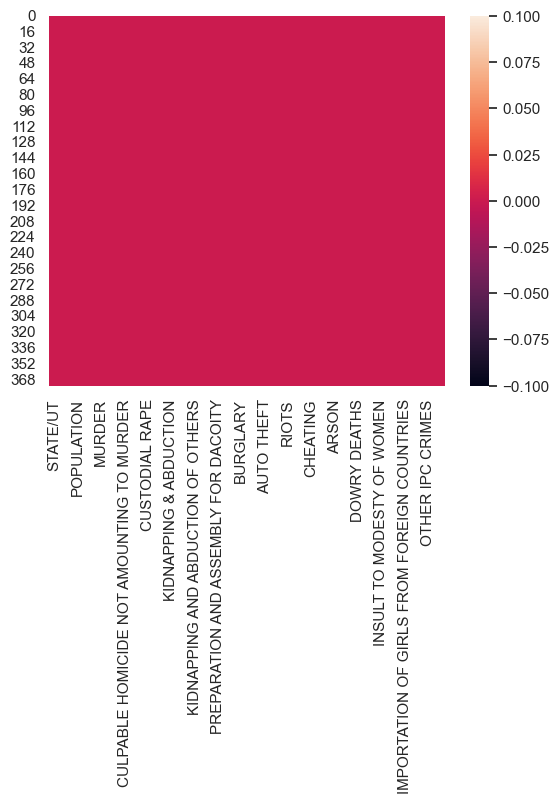

In [87]:
sns.heatmap(data.isnull())

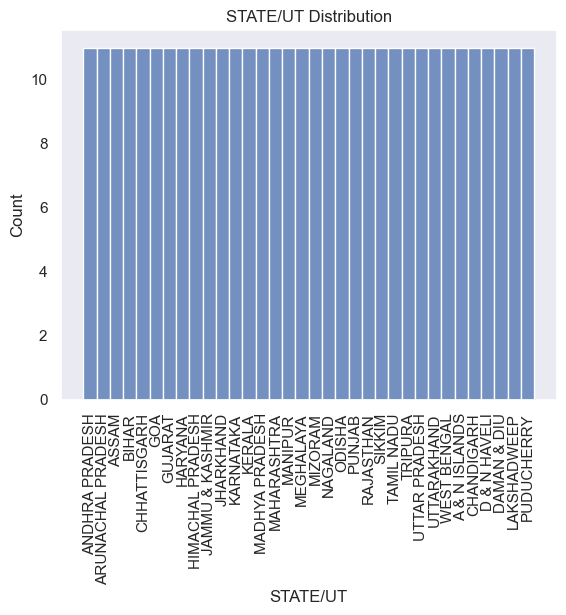

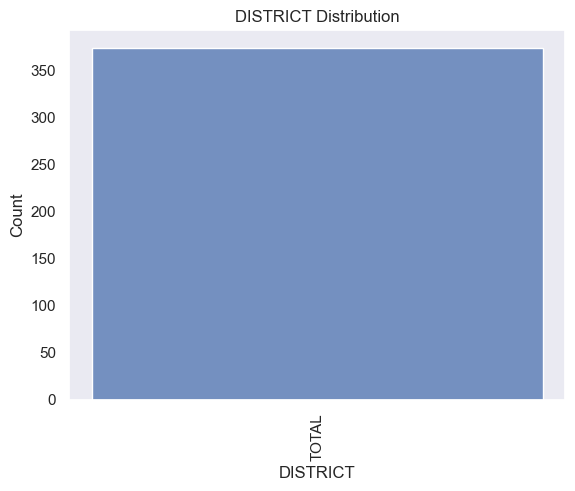

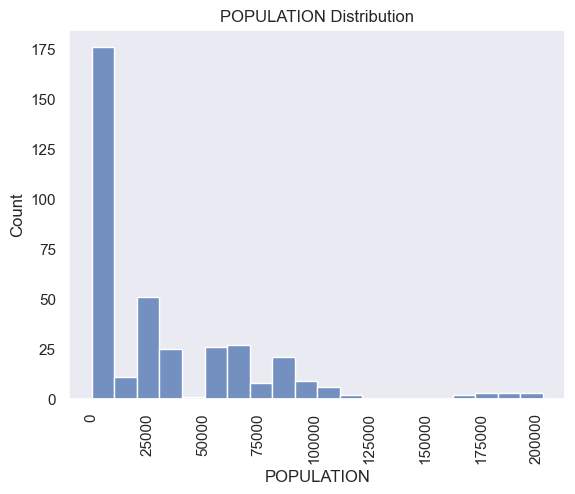

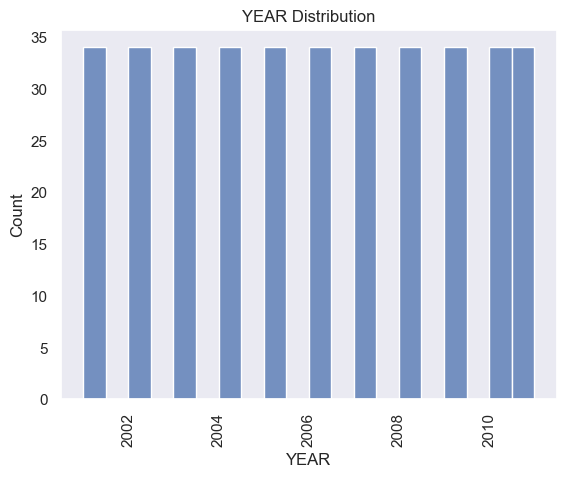

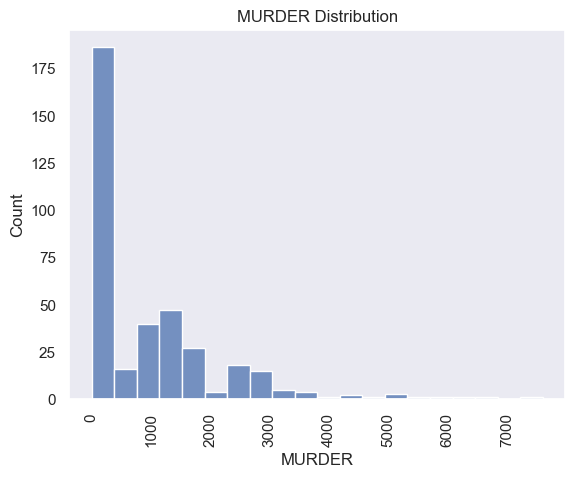

...

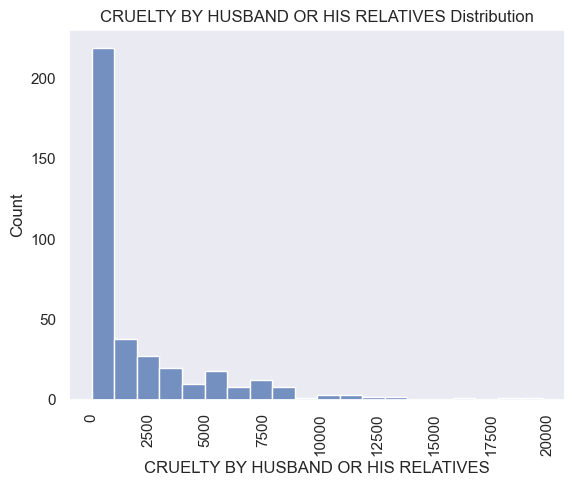

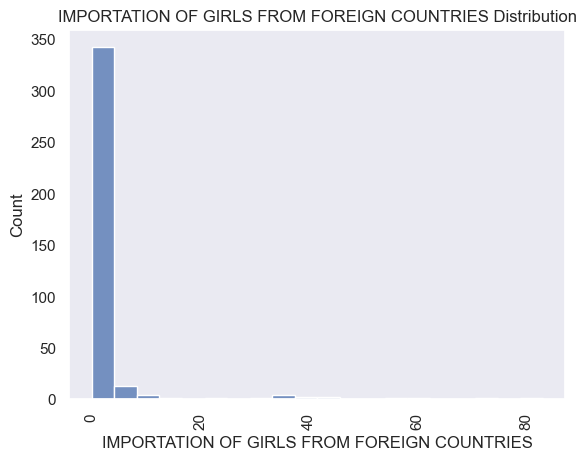

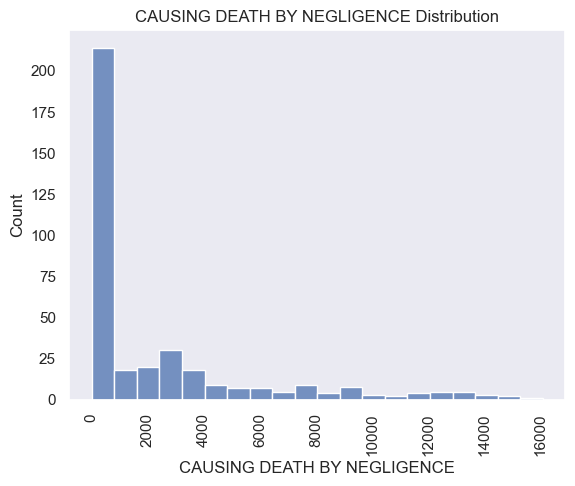

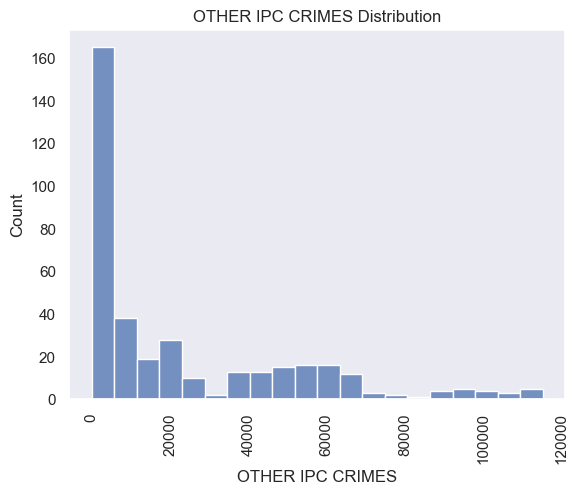

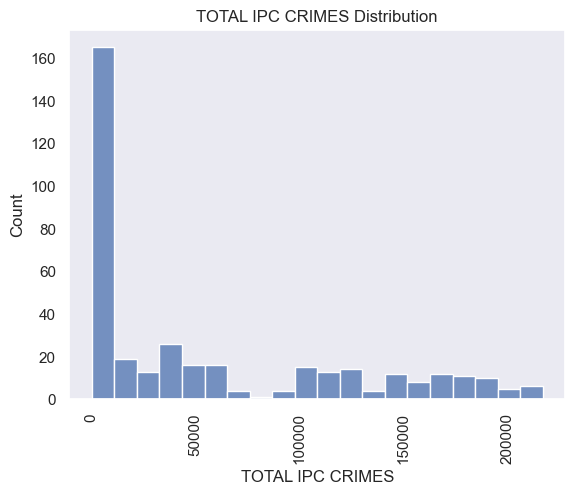

In [88]:
for i in data.columns:
    sns.histplot(x=i,data=data,kde=False,bins=20)
    plt.title(f'{i} Distribution')
    plt.xlabel(i)
    plt.ylabel('Count')
    plt.xticks(rotation=90)
    plt.show()


Histplot showing univariate analysis

This showing reported murders in each state with population in each state.

In [89]:
R = pd.DataFrame(data.groupby(["STATE/UT",'YEAR'])['POPULATION',"RAPE"].sum().reset_index())
R.head()

,STATE/UT,YEAR,POPULATION,RAPE
0,A & N ISLANDS,2001,359,3
1,A & N ISLANDS,2002,372,2
2,A & N ISLANDS,2003,385,2
3,A & N ISLANDS,2004,399,10
4,A & N ISLANDS,2005,413,4


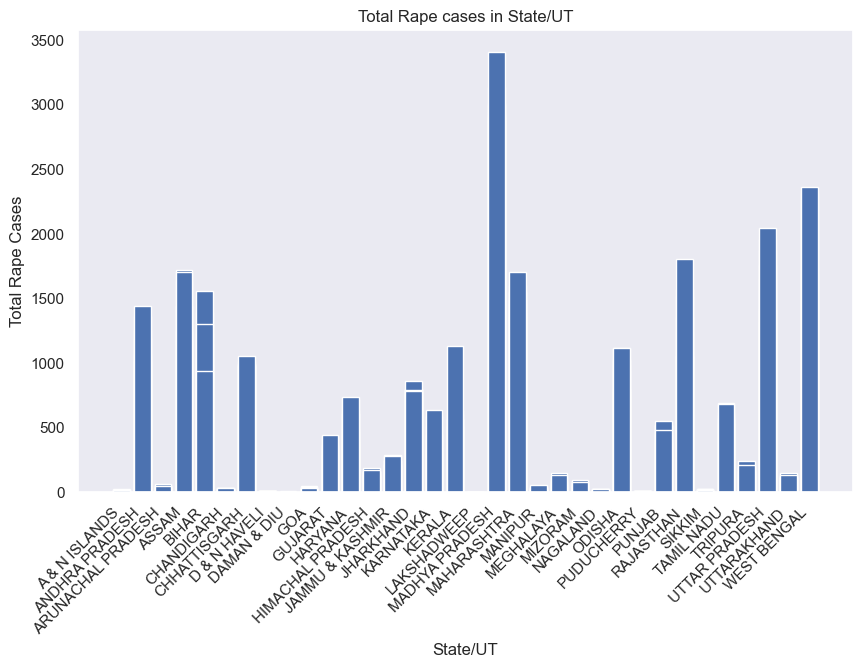

In [90]:
# plotting
plt.figure(figsize=(10, 6))
plt.bar(R['STATE/UT'], R['RAPE'])
plt.xlabel('State/UT')
plt.ylabel('Total Rape Cases')
plt.title('Total Rape cases in State/UT')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.show()

In [91]:
K = pd.DataFrame(data.groupby(["STATE/UT"])['POPULATION',"KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS"].sum().reset_index())
K.head()

,STATE/UT,POPULATION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS
0,A & N ISLANDS,4720,70
1,ANDHRA PRADESH,892128,13533
2,ARUNACHAL PRADESH,12959,500
3,ASSAM,317608,19560
4,BIHAR,1006627,15600


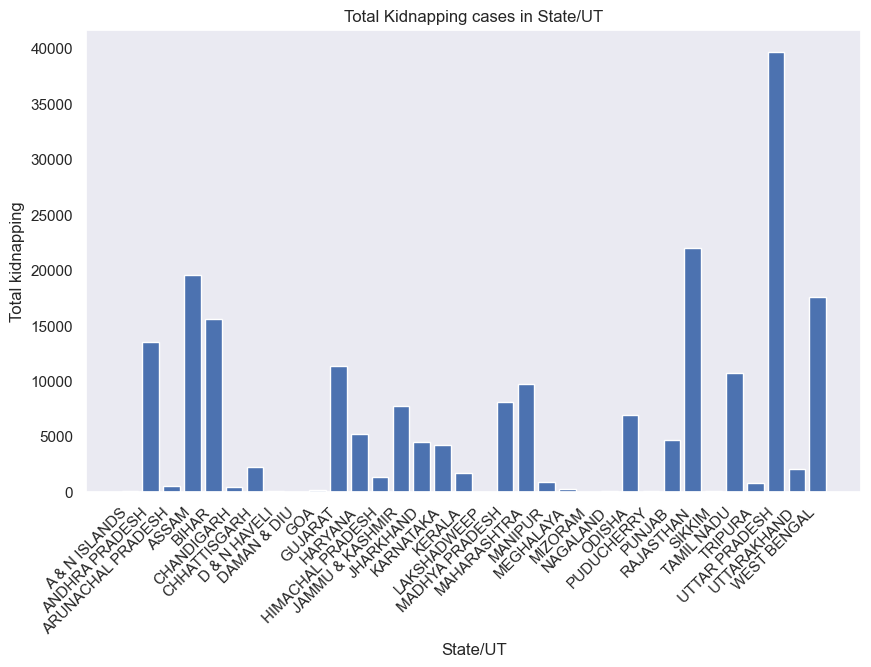

In [92]:
# plotting
plt.figure(figsize=(10, 6))
plt.bar(K['STATE/UT'], K['KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS'])
plt.xlabel('State/UT')
plt.ylabel('Total kidnapping')
plt.title('Total Kidnapping cases in State/UT')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.show()

In [93]:
D = pd.DataFrame(data.groupby(["STATE/UT"])['POPULATION',"DOWRY DEATHS"].sum().reset_index())
D.head()

,STATE/UT,POPULATION,DOWRY DEATHS
0,A & N ISLANDS,4720,4
1,ANDHRA PRADESH,892128,5711
2,ARUNACHAL PRADESH,12959,1
3,ASSAM,317608,1136
4,BIHAR,1006627,12273


Showing population in each state/ut.
Murder cases in each state/ut.
Uttar pradesh has high population also has high number of murder cases reported in UP.  

# Analyzing Population with Overall crimes in Each state

In [94]:

AM = pd.DataFrame(data.groupby(["STATE/UT", "YEAR"])['POPULATION', 'ATTEMPT TO MURDER'].sum().reset_index())
AM.head()

,STATE/UT,YEAR,POPULATION,ATTEMPT TO MURDER
0,A & N ISLANDS,2001,359,0
1,A & N ISLANDS,2002,372,3
2,A & N ISLANDS,2003,385,4
3,A & N ISLANDS,2004,399,1
4,A & N ISLANDS,2005,413,3


Above table showing attempt to muder cases reported in each state in year(2001-2011) with population of each state in that perticular year.

In [95]:
T = pd.DataFrame(data.groupby(["STATE/UT", "YEAR"])['POPULATION', 'THEFT'].sum().reset_index())
T.head()

,STATE/UT,YEAR,POPULATION,THEFT
0,A & N ISLANDS,2001,359,65
1,A & N ISLANDS,2002,372,49
2,A & N ISLANDS,2003,385,60
3,A & N ISLANDS,2004,399,103
4,A & N ISLANDS,2005,413,92


In [96]:
I = pd.DataFrame(data.groupby(["STATE/UT", "YEAR"])['POPULATION', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'].sum().reset_index())
I.head()

,STATE/UT,YEAR,POPULATION,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES
0,A & N ISLANDS,2001,359,0
1,A & N ISLANDS,2002,372,0
2,A & N ISLANDS,2003,385,0
3,A & N ISLANDS,2004,399,0
4,A & N ISLANDS,2005,413,0


In [97]:
ka = pd.DataFrame(data.groupby(["STATE/UT", "YEAR"])['POPULATION', 'KIDNAPPING & ABDUCTION'].sum().reset_index())
ka.head()

,STATE/UT,YEAR,POPULATION,KIDNAPPING & ABDUCTION
0,A & N ISLANDS,2001,359,2
1,A & N ISLANDS,2002,372,2
2,A & N ISLANDS,2003,385,2
3,A & N ISLANDS,2004,399,3
4,A & N ISLANDS,2005,413,2


# Visualize statewise overall crimes and population over year(2001-2011)

In [98]:
maha = data[(data['STATE/UT']=='MAHARASHTRA')]
maha

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
14,MAHARASHTRA,TOTAL,97926,2001,2839,1454,101,1302,0,1302,...,1208,30212,308,2823,1120,6090,1,8993,42963,171233
48,MAHARASHTRA,TOTAL,99371,2002,2768,1435,93,1352,1,1351,...,1269,29250,303,2686,769,5353,0,9407,42643,165462
82,MAHARASHTRA,TOTAL,100966,2003,2772,1412,113,1268,0,1268,...,1188,29205,368,2661,682,5452,0,9378,42491,164306
116,MAHARASHTRA,TOTAL,102566,2004,2696,1463,115,1388,0,1388,...,1149,30122,314,2831,862,5646,0,9574,44420,176302
150,MAHARASHTRA,TOTAL,104160,2005,2621,1614,98,1545,0,1545,...,1123,30017,341,3228,919,6233,0,9608,47386,187027
184,MAHARASHTRA,TOTAL,105740,2006,2656,1680,100,1500,1,1499,...,1188,29407,387,3479,984,6738,1,10933,49834,191788
218,MAHARASHTRA,TOTAL,107321,2007,2693,1615,113,1451,0,1451,...,1267,29622,436,3306,1039,7356,0,11946,50159,195707
252,MAHARASHTRA,TOTAL,108908,2008,2795,1837,111,1558,0,1558,...,1288,29742,390,3619,1091,7829,0,12472,50183,206243
286,MAHARASHTRA,TOTAL,110485,2009,2653,1880,98,1483,0,1483,...,1105,28326,341,3196,1099,7681,0,12459,48460,199598
320,MAHARASHTRA,TOTAL,112042,2010,2744,1926,152,1599,0,1599,...,1229,29696,393,3661,1180,7434,0,13508,49739,208168


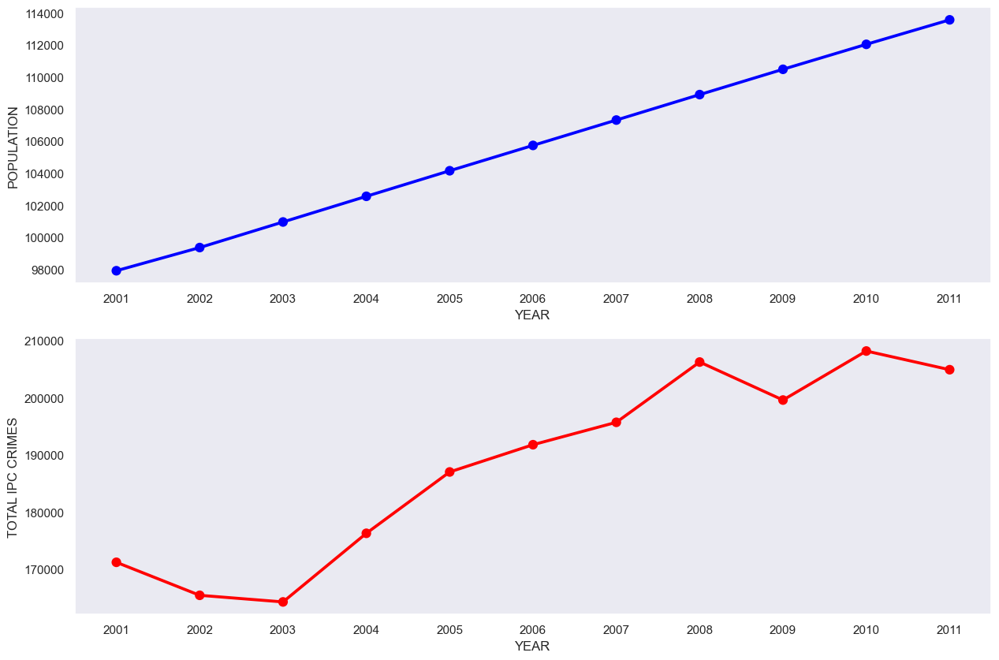

In [99]:
fig, (ax_0, ax_1) = plt.subplots(figsize=(15,10), nrows=2)
sns.pointplot(data=maha, x='YEAR', y="POPULATION", ax=ax_0, color="blue");
sns.pointplot(data=maha, x='YEAR', y="TOTAL IPC CRIMES", ax=ax_1, color="red");

here we analyze the population of maharashtra state .
1st graph showing population increases year by year .
2nd graph analyze total ipc crimes in maharashtra over year.

In [100]:
ker = data[(data['STATE/UT']=='KERALA')]
ker

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
12,KERALA,TOTAL,31972,2001,472,615,111,562,0,562,...,768,19829,27,1942,81,2561,0,0,54544,103847
46,KERALA,TOTAL,32303,2002,454,562,210,499,0,499,...,452,19033,17,2123,102,2836,0,32,55094,104200
80,KERALA,TOTAL,32591,2003,435,448,343,394,0,394,...,413,17696,33,1947,68,2930,0,35,53487,98824
114,KERALA,TOTAL,32875,2004,417,391,473,480,0,480,...,374,20610,31,2260,133,3222,0,42,54106,104025
148,KERALA,TOTAL,33154,2005,388,341,88,478,0,478,...,456,18302,21,2339,175,3283,0,34,57530,104350
182,KERALA,TOTAL,33426,2006,393,347,87,601,0,601,...,435,19105,25,2543,222,3708,0,49,56777,105255
216,KERALA,TOTAL,33694,2007,367,402,92,512,0,512,...,398,18975,27,2624,262,3999,0,59,57681,108530
250,KERALA,TOTAL,33958,2008,362,434,95,568,0,568,...,389,19178,31,2745,258,4138,0,37,59061,110620
284,KERALA,TOTAL,34216,2009,343,408,100,568,0,568,...,503,18274,20,2540,395,4007,0,41,68688,118369
318,KERALA,TOTAL,34467,2010,363,361,86,634,0,634,...,374,18532,22,2936,537,4797,0,47,98668,148313


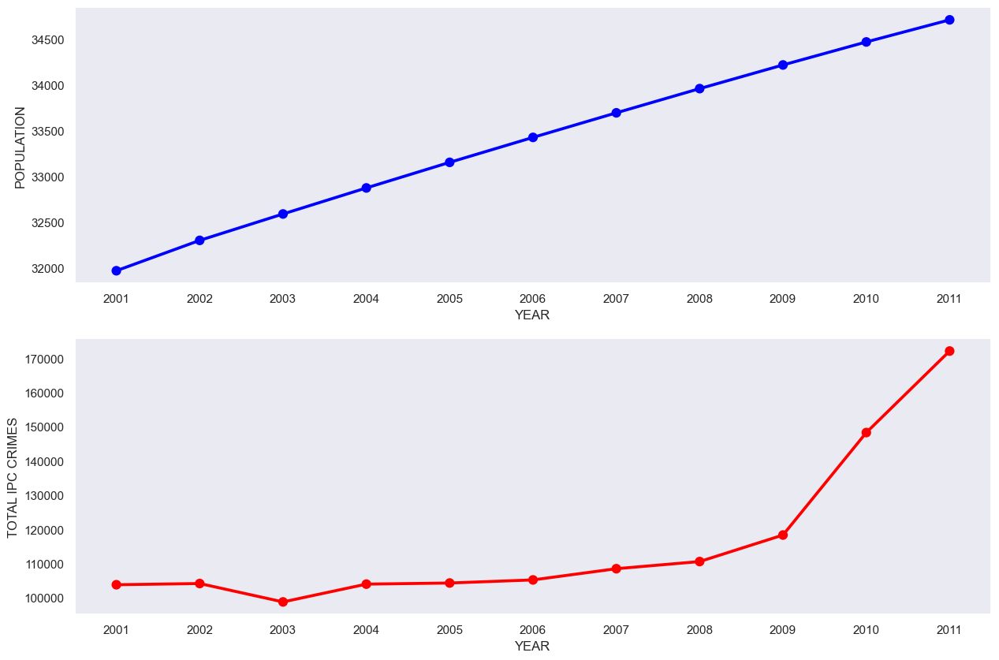

In [101]:
fig, (ax_0, ax_1) = plt.subplots(figsize=(15,10), nrows=2)
sns.pointplot(data=ker, x='YEAR', y="POPULATION", ax=ax_0, color="blue");
sns.pointplot(data=ker, x='YEAR', y="TOTAL IPC CRIMES", ax=ax_1, color="red");

population getting increase over year 
reported number of crimes getting high in number .
in 2011 total reported ipc crimes are more than previous years.

In [102]:
raj = data[(data['STATE/UT']=='RAJASTHAN')]
raj

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
21,RAJASTHAN,TOTAL,57370,2001,1259,1923,63,1049,0,1049,...,1092,27485,376,2878,56,5532,1,4221,62347,155185
55,RAJASTHAN,TOTAL,58350,2002,1276,2043,68,1051,0,1051,...,1130,26519,399,2730,44,5691,0,4670,63787,151248
89,RAJASTHAN,TOTAL,59512,2003,1262,1977,61,1050,0,1050,...,784,26173,389,2715,33,5733,1,5074,62592,145579
123,RAJASTHAN,TOTAL,60670,2004,1279,2030,59,1038,0,1038,...,835,25947,379,2825,41,6781,1,5579,67767,154859
157,RAJASTHAN,TOTAL,61818,2005,1221,1920,59,993,0,993,...,648,22606,361,2503,28,5997,0,5872,61549,140917
191,RAJASTHAN,TOTAL,62951,2006,1209,1694,79,1085,0,1085,...,551,21296,394,2582,31,7038,3,6234,61379,141992
225,RAJASTHAN,TOTAL,64077,2007,1303,1772,64,1238,0,1238,...,675,19720,439,2477,28,8170,0,7096,63846,148870
259,RAJASTHAN,TOTAL,65200,2008,1297,1649,54,1355,0,1355,...,615,21117,439,2520,19,8113,0,7322,63924,151174
293,RAJASTHAN,TOTAL,66310,2009,1395,1673,80,1519,0,1519,...,556,21652,436,2485,24,10371,0,7898,70089,166565
327,RAJASTHAN,TOTAL,67401,2010,1421,1557,104,1571,0,1571,...,478,19247,462,2339,23,11145,0,7978,67221,162957


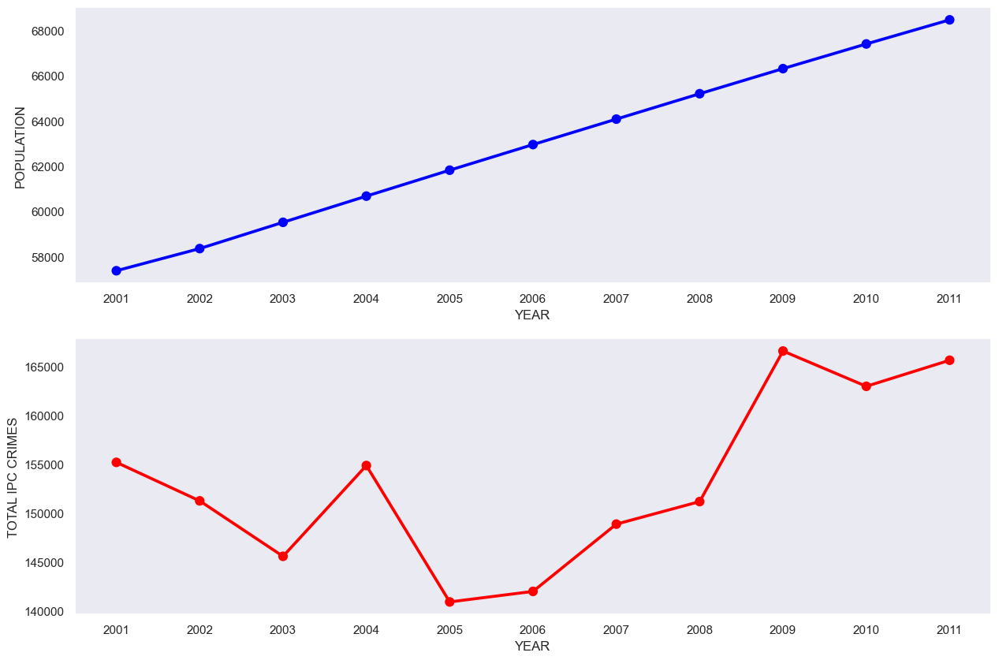

In [103]:
fig, (ax_0, ax_1) = plt.subplots(figsize=(15,10), nrows=2)
sns.pointplot(data=raj, x='YEAR', y="POPULATION", ax=ax_0, color="blue");
sns.pointplot(data=raj, x='YEAR', y="TOTAL IPC CRIMES", ax=ax_1, color="red");

In [104]:
up = data[(data['STATE/UT']=='UTTAR PRADESH')]
up

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
25,UTTAR PRADESH,TOTAL,168451,2001,7601,7964,1186,1958,0,1958,...,812,17816,2211,2870,2575,7365,0,7129,57839,178129
59,UTTAR PRADESH,TOTAL,171532,2002,6825,6283,1243,1415,1,1414,...,643,13947,1893,2145,1887,5679,0,7313,48569,146037
93,UTTAR PRADESH,TOTAL,174956,2003,5284,3793,1525,911,0,911,...,297,7760,1322,1098,4970,2626,0,4428,29449,95073
127,UTTAR PRADESH,TOTAL,178406,2004,6126,5580,1436,1397,0,1397,...,381,11265,1708,1900,2682,4950,3,7136,40711,130181
161,UTTAR PRADESH,TOTAL,181868,2005,5711,5637,1520,1217,0,1217,...,398,10379,1564,1835,2881,4505,0,7406,37158,122108
195,UTTAR PRADESH,TOTAL,185330,2006,5480,4997,1543,1314,0,1314,...,299,10412,1798,2096,2714,5204,0,7235,41536,127001
229,UTTAR PRADESH,TOTAL,188812,2007,5000,4424,1616,1648,0,1648,...,268,10694,2076,2522,2882,7650,0,7655,51914,150258
263,UTTAR PRADESH,TOTAL,192325,2008,4564,4233,1493,1871,0,1871,...,228,11683,2237,2955,3374,8312,0,10102,60242,168996
297,UTTAR PRADESH,TOTAL,195841,2009,4534,4141,1439,1759,0,1759,...,254,10934,2232,2782,2524,8566,0,12159,60918,172884
331,UTTAR PRADESH,TOTAL,199347,2010,4401,4004,1401,1563,1,1562,...,170,10336,2217,2793,11,7978,0,14472,61500,174179


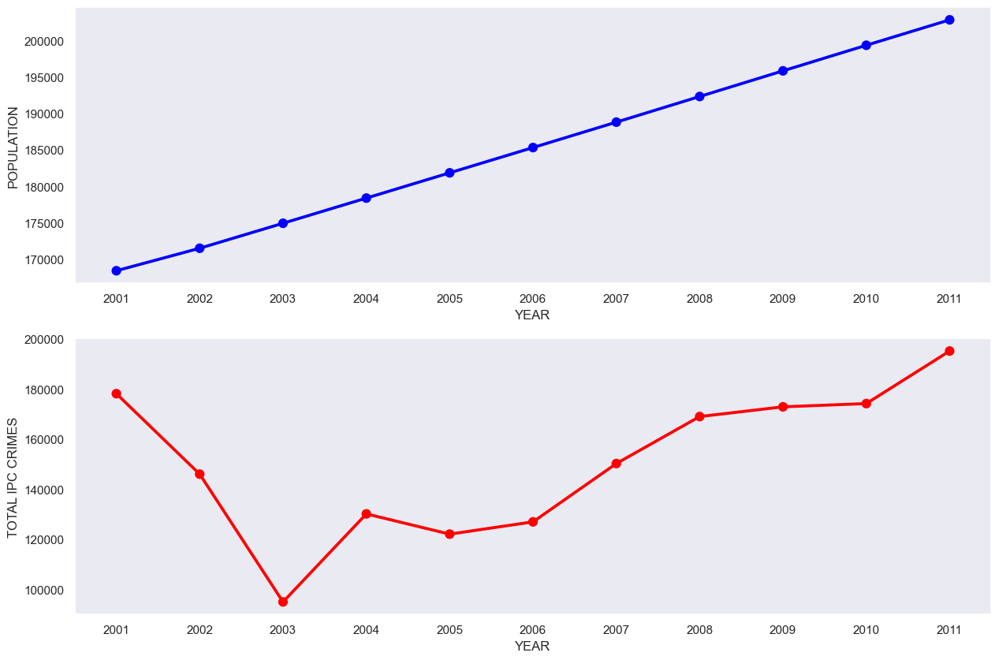

In [105]:
fig, (ax_0, ax_1) = plt.subplots(figsize=(15,10), nrows=2)
sns.pointplot(data=up, x='YEAR', y="POPULATION", ax=ax_0, color="blue");
sns.pointplot(data=up, x='YEAR', y="TOTAL IPC CRIMES", ax=ax_1, color="red");

In [106]:
jk = data[(data['STATE/UT']=='JAMMU & KASHMIR')]
jk

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
9,JAMMU & KASHMIR,TOTAL,10291,2001,1075,1474,33,169,0,169,...,437,318,13,622,288,50,0,357,9046,19505
43,JAMMU & KASHMIR,TOTAL,10395,2002,1048,1240,31,192,0,192,...,386,366,18,785,368,54,0,380,9390,19967
77,JAMMU & KASHMIR,TOTAL,10556,2003,929,1216,29,211,0,211,...,328,310,10,875,376,71,0,378,10424,21233
111,JAMMU & KASHMIR,TOTAL,10717,2004,816,1112,29,218,0,218,...,320,334,9,990,264,82,0,422,10677,21191
145,JAMMU & KASHMIR,TOTAL,10877,2005,647,905,37,201,0,201,...,240,355,5,830,371,76,0,462,10040,20115
179,JAMMU & KASHMIR,TOTAL,11035,2006,487,854,40,250,0,250,...,203,376,10,960,347,135,0,222,10886,20787
213,JAMMU & KASHMIR,TOTAL,11192,2007,318,669,23,288,0,288,...,186,374,9,986,353,176,0,243,11535,21443
247,JAMMU & KASHMIR,TOTAL,11350,2008,237,570,31,219,0,219,...,230,273,21,935,296,162,0,293,10734,20604
281,JAMMU & KASHMIR,TOTAL,11506,2009,237,547,23,237,0,237,...,217,331,12,972,371,196,0,517,11059,21975
315,JAMMU & KASHMIR,TOTAL,11659,2010,217,711,26,245,0,245,...,224,278,9,1038,262,211,0,494,11869,23223


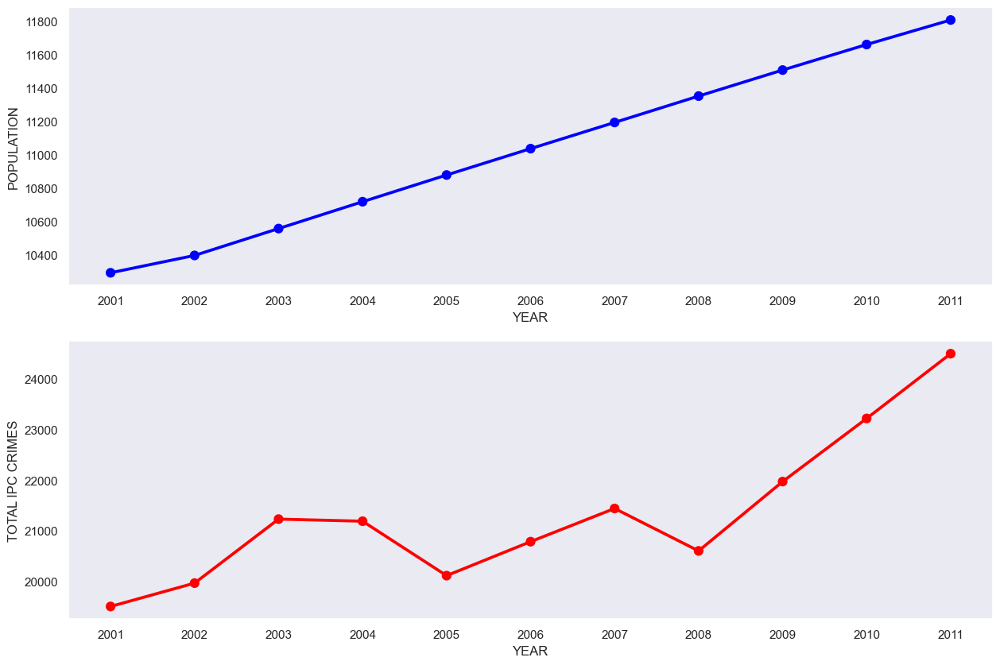

In [107]:
fig, (ax_0, ax_1) = plt.subplots(figsize=(15,10), nrows=2)
sns.pointplot(data=jk, x='YEAR', y="POPULATION", ax=ax_0, color="blue");
sns.pointplot(data=jk, x='YEAR', y="TOTAL IPC CRIMES", ax=ax_1, color="red");

In [108]:
tam = data[(data['STATE/UT']=='TAMIL NADU')]
tam

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
23,TAMIL NADU,TOTAL,62742,2001,1662,2204,19,423,0,423,...,980,28429,191,1773,1012,815,14,8550,76468,154801
57,TAMIL NADU,TOTAL,63332,2002,1723,2133,36,534,0,534,...,850,25150,243,1877,1718,1052,0,10125,88680,166942
91,TAMIL NADU,TOTAL,63883,2003,1591,1843,28,557,1,556,...,791,30228,220,2022,881,1555,1,9112,77784,157186
125,TAMIL NADU,TOTAL,64416,2004,1479,1772,26,618,0,618,...,662,30855,225,1861,1081,1437,0,9152,88439,166606
159,TAMIL NADU,TOTAL,64933,2005,1440,1759,28,571,1,570,...,495,31725,215,1764,665,1650,0,8902,86494,162360
193,TAMIL NADU,TOTAL,65435,2006,1363,1599,20,457,0,457,...,460,14067,187,1179,852,1248,0,10792,94131,148972
227,TAMIL NADU,TOTAL,65919,2007,1633,2078,28,523,0,523,...,653,16967,208,1540,875,1976,0,11485,110748,172754
261,TAMIL NADU,TOTAL,66386,2008,1759,2327,28,573,0,573,...,610,20529,207,1705,974,1648,0,12328,107084,176833
295,TAMIL NADU,TOTAL,66836,2009,1776,2325,26,596,0,596,...,580,18147,194,1242,501,1460,0,13528,106215,174691
329,TAMIL NADU,TOTAL,67273,2010,1875,2641,32,686,0,686,...,636,21309,165,1405,638,1570,0,14644,110733,185678


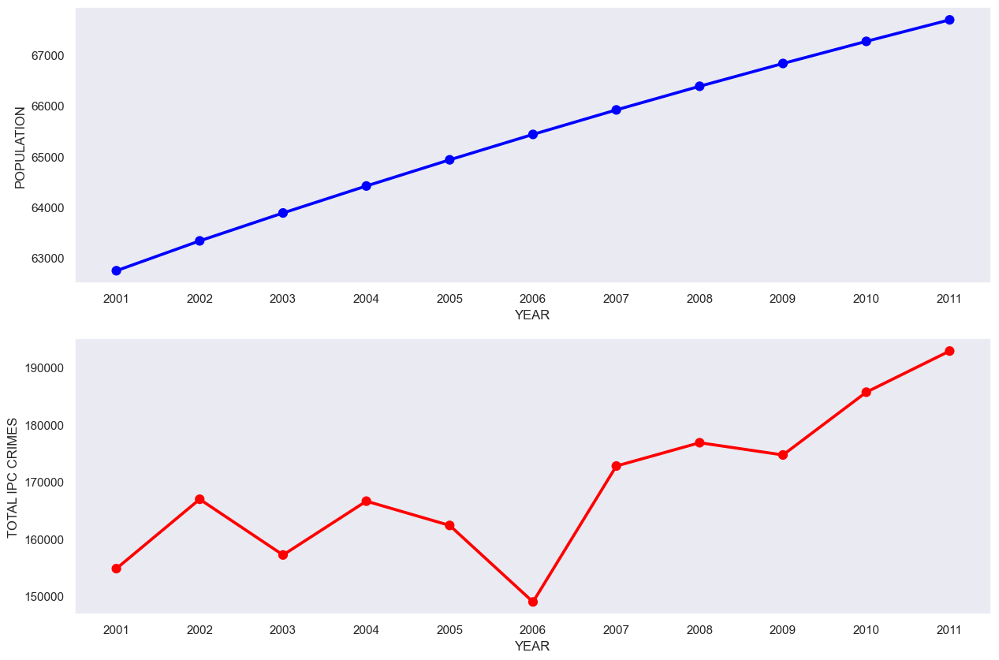

In [109]:
fig, (ax_0, ax_1) = plt.subplots(figsize=(15,10), nrows=2)
sns.pointplot(data=tam, x='YEAR', y="POPULATION", ax=ax_0, color="blue");
sns.pointplot(data=tam, x='YEAR', y="TOTAL IPC CRIMES", ax=ax_1, color="red");

---------------------------------------------------------------------------

# 2.3:Analysis of year-on-year total crime rate.

I have population and total ipc crime data
so from that we can calculate crime rate of each year.

formula:crime_rate = (total_ipc_crimes / population) * 1000
with this formula we calculate crime rate.

I took same file data but add only one column with crime rate and create new file .

In [110]:
df = pd.read_csv('C:\\Users\\SNEHAL\\Downloads\\Capstone-Project-File\\YearOnYear_CrimeRate.csv')
df

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,TOTAL CRIME RATE
0,ANDHRA PRADESH,TOTAL,76542,2001,2602,1555,136,871,0,871,...,34947,420,3544,2271,5791,7,7400,34344,130089,1699.576703
1,ARUNACHAL PRADESH,TOTAL,1110,2001,83,53,3,33,0,33,...,466,0,78,3,11,0,0,618,2342,2109.909910
2,ASSAM,TOTAL,26873,2001,1356,481,40,817,0,817,...,5805,59,850,4,1248,0,2010,9315,36877,1372.269564
3,BIHAR,TOTAL,84385,2001,3643,3419,250,888,0,888,...,7544,859,562,21,1558,83,2406,36667,88432,1047.958760
4,CHHATTISGARH,TOTAL,20969,2001,880,529,45,959,0,959,...,5477,70,1763,161,840,0,689,15790,38460,1834.136106
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369,CHANDIGARH,TOTAL,1480,2011,24,40,6,27,0,27,...,45,2,21,12,46,0,7,1036,3542,2393.243243
370,D & N HAVELI,TOTAL,364,2011,14,2,0,4,0,4,...,25,0,2,0,3,0,24,134,372,1021.978022
371,DAMAN & DIU,TOTAL,277,2011,6,1,0,1,0,1,...,11,0,0,0,2,0,43,35,224,808.664260
372,LAKSHADWEEP,TOTAL,76,2011,0,1,0,0,0,0,...,3,0,0,0,0,0,0,27,44,578.947368


In [111]:
an = df[(df['STATE/UT']=='CHHATTISGARH')]
an

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,TOTAL CRIME RATE
4,CHHATTISGARH,TOTAL,20969,2001,880,529,45,959,0,959,...,5477,70,1763,161,840,0,689,15790,38460,1834.136106
38,CHHATTISGARH,TOTAL,21412,2002,844,453,24,992,0,992,...,4484,85,1483,147,653,0,963,17576,37950,1772.370633
72,CHHATTISGARH,TOTAL,21764,2003,776,513,51,898,0,898,...,3653,79,1481,105,601,0,1158,19315,38449,1766.632972
106,CHHATTISGARH,TOTAL,22111,2004,927,619,25,969,0,969,...,3899,71,1661,131,741,0,1717,20143,41927,1896.205509
140,CHHATTISGARH,TOTAL,22455,2005,1013,660,41,990,0,990,...,3734,100,1450,132,732,0,2004,20959,43633,1943.130706
174,CHHATTISGARH,TOTAL,22797,2006,1098,825,15,995,0,995,...,6722,103,1598,143,717,1,2239,19246,45177,1981.708119
208,CHHATTISGARH,TOTAL,23134,2007,1097,747,26,982,0,982,...,6801,100,1549,111,824,0,2476,19505,45845,1981.715224
242,CHHATTISGARH,TOTAL,23466,2008,1169,736,18,978,0,978,...,8565,106,1621,125,897,0,2800,21074,51442,2192.192960
276,CHHATTISGARH,TOTAL,23796,2009,1083,732,19,976,0,976,...,9543,128,1598,152,893,0,2735,20546,51370,2158.766179
310,CHHATTISGARH,TOTAL,24124,2010,1065,756,30,1012,0,1012,...,10188,115,1706,182,861,2,2907,23091,54958,2278.146244


In [112]:
df.shape

(374, 35)

In [113]:
df.dtypes

STATE/UT                                                object
DISTRICT                                                object
POPULATION                                               int64
YEAR                                                     int64
MURDER                                                   int64
ATTEMPT TO MURDER                                        int64
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER                int64
RAPE                                                     int64
CUSTODIAL RAPE                                           int64
OTHER RAPE                                               int64
KIDNAPPING & ABDUCTION                                   int64
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS              int64
KIDNAPPING AND ABDUCTION OF OTHERS                       int64
DACOITY                                                  int64
PREPARATION AND ASSEMBLY FOR DACOITY                     int64
ROBBERY                                                

In [114]:
df.duplicated().sum()

0

In [115]:
df.isnull().sum()

STATE/UT                                               0
DISTRICT                                               0
POPULATION                                             0
YEAR                                                   0
MURDER                                                 0
ATTEMPT TO MURDER                                      0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              0
RAPE                                                   0
CUSTODIAL RAPE                                         0
OTHER RAPE                                             0
KIDNAPPING & ABDUCTION                                 0
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS            0
KIDNAPPING AND ABDUCTION OF OTHERS                     0
DACOITY                                                0
PREPARATION AND ASSEMBLY FOR DACOITY                   0
ROBBERY                                                0
BURGLARY                                               0
THEFT                          

In [116]:
df.columns

Index(['STATE/UT', 'DISTRICT', 'POPULATION', 'YEAR', 'MURDER',
       'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',
       'RAPE', 'CUSTODIAL RAPE', 'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'TOTAL CRIME RATE'],
      dtype='object')

In [117]:
cat = df.select_dtypes(['object']).columns
num = df.select_dtypes(['number']).columns
print(cat)
print()
print(num)

Index(['STATE/UT', 'DISTRICT'], dtype='object')

Index(['POPULATION', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'TOTAL CRIME RATE'],
      dtype='object')


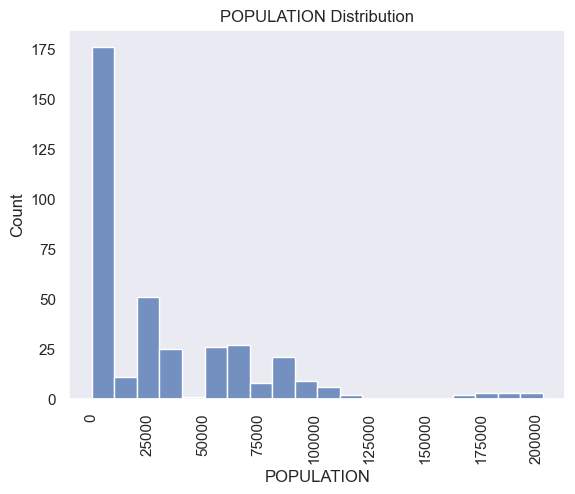

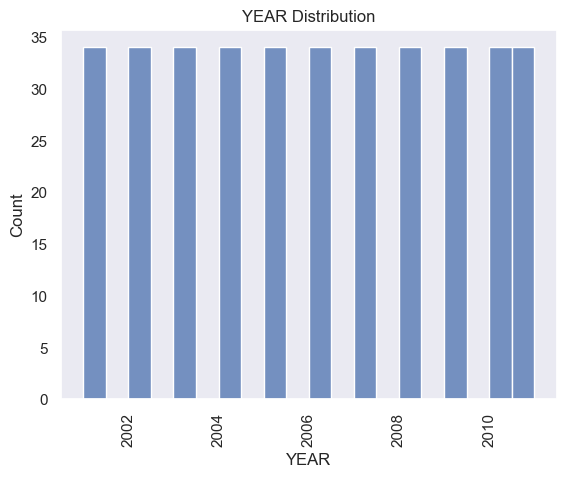

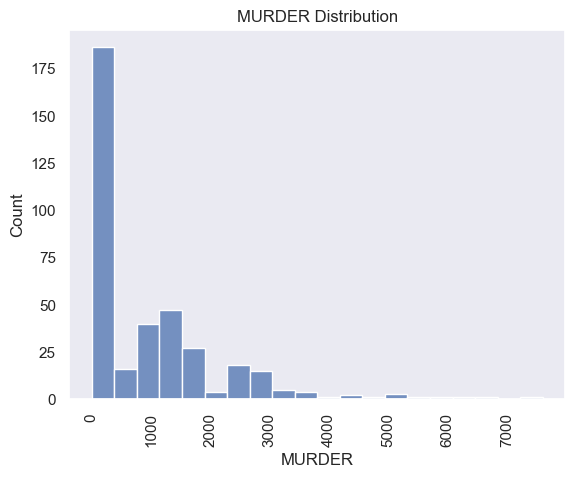

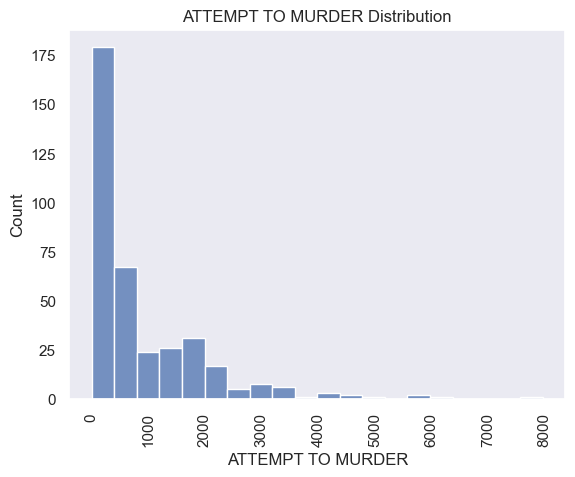

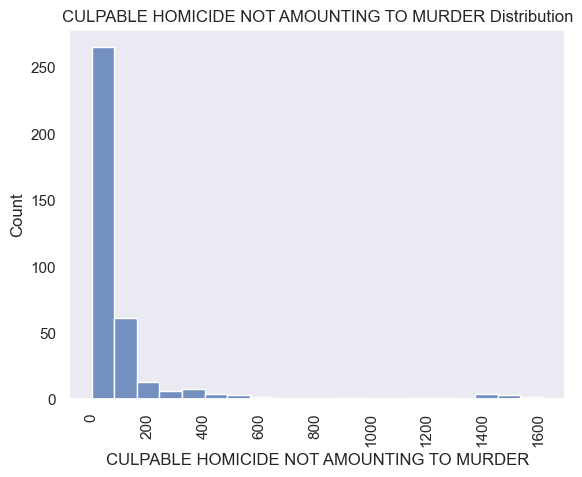

...

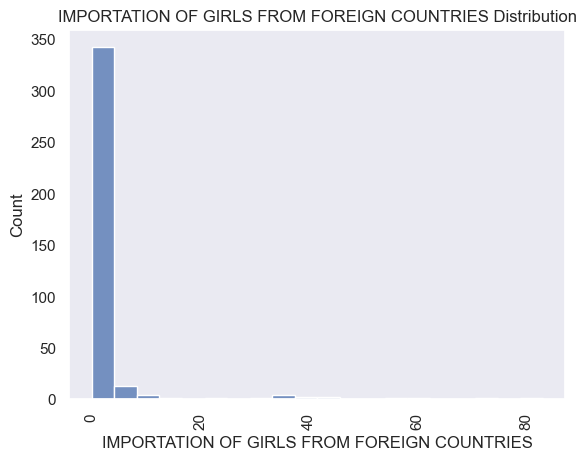

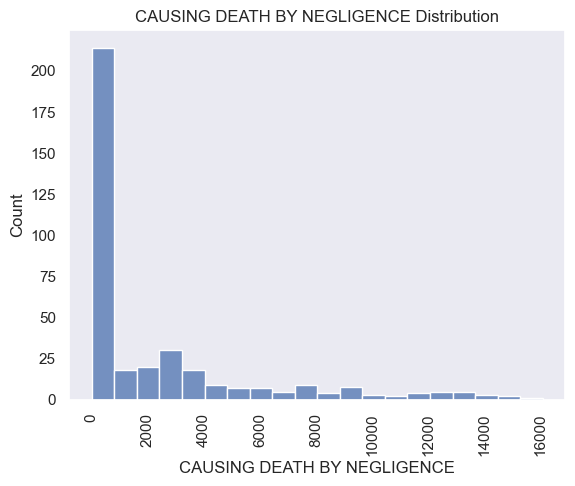

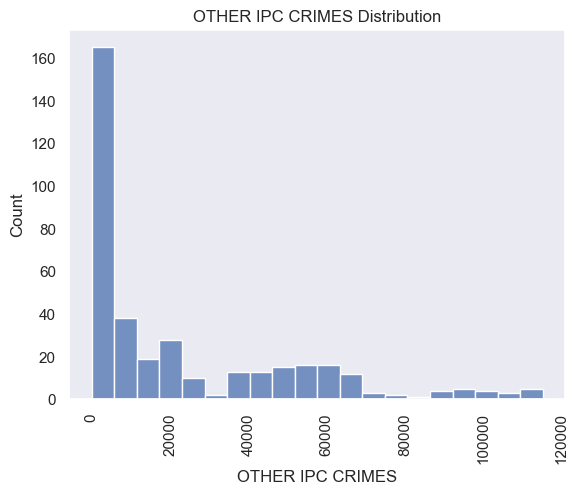

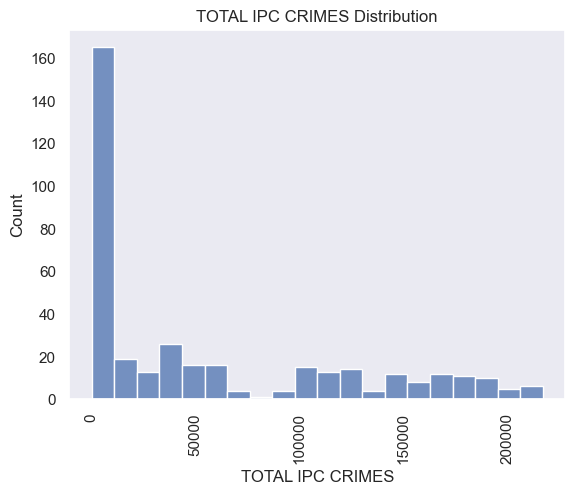

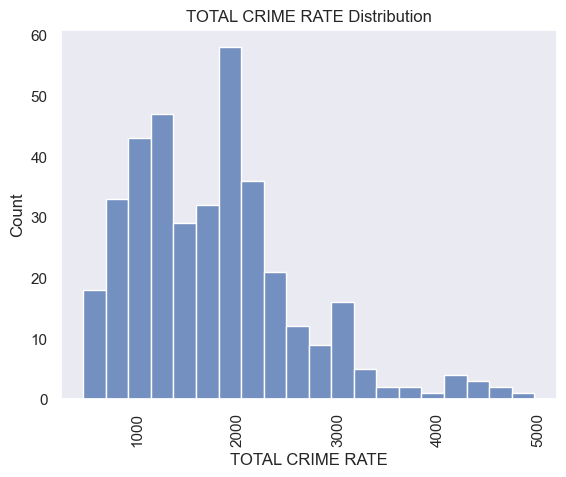

In [118]:
for i in num:
    sns.histplot(x=i,data=df,kde=False,bins=20)
    plt.title(f'{i} Distribution')
    plt.xlabel(i)
    plt.ylabel('Count')
    plt.xticks(rotation=90)
    plt.show()

crime rate of each state in over every year(2001-2011)

In [119]:
rate2001 = df[(df['YEAR']==2001)]
rate2001

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,TOTAL CRIME RATE
0,ANDHRA PRADESH,TOTAL,76542,2001,2602,1555,136,871,0,871,...,34947,420,3544,2271,5791,7,7400,34344,130089,1699.576703
1,ARUNACHAL PRADESH,TOTAL,1110,2001,83,53,3,33,0,33,...,466,0,78,3,11,0,0,618,2342,2109.909910
2,ASSAM,TOTAL,26873,2001,1356,481,40,817,0,817,...,5805,59,850,4,1248,0,2010,9315,36877,1372.269564
3,BIHAR,TOTAL,84385,2001,3643,3419,250,888,0,888,...,7544,859,562,21,1558,83,2406,36667,88432,1047.958760
4,CHHATTISGARH,TOTAL,20969,2001,880,529,45,959,0,959,...,5477,70,1763,161,840,0,689,15790,38460,1834.136106
5,GOA,TOTAL,1360,2001,36,30,5,12,0,12,...,174,2,17,7,11,0,191,697,2341,1721.323529
6,GUJARAT,TOTAL,51349,2001,1226,537,94,286,0,286,...,13760,67,756,111,3667,0,2924,50719,103419,2014.041169
7,HARYANA,TOTAL,21467,2001,781,467,78,398,0,398,...,4744,285,478,401,1513,0,856,15906,38759,1805.515442
8,HIMACHAL PRADESH,TOTAL,6131,2001,119,75,11,124,0,124,...,1403,10,310,14,317,0,483,6052,11499,1875.550481
9,JAMMU & KASHMIR,TOTAL,10291,2001,1075,1474,33,169,0,169,...,318,13,622,288,50,0,357,9046,19505,1895.345447


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33]),
 [Text(0, 0, 'ANDHRA PRADESH'),
  Text(1, 0, 'ARUNACHAL PRADESH'),
  Text(2, 0, 'ASSAM'),
  Text(3, 0, 'BIHAR'),
  Text(4, 0, 'CHHATTISGARH'),
  Text(5, 0, 'GOA'),
  Text(6, 0, 'GUJARAT'),
  Text(7, 0, 'HARYANA'),
  Text(8, 0, 'HIMACHAL PRADESH'),
  Text(9, 0, 'JAMMU & KASHMIR'),
  Text(10, 0, 'JHARKHAND'),
  Text(11, 0, 'KARNATAKA'),
  Text(12, 0, 'KERALA'),
  Text(13, 0, 'MADHYA PRADESH'),
  Text(14, 0, 'MAHARASHTRA'),
  Text(15, 0, 'MANIPUR'),
  Text(16, 0, 'MEGHALAYA'),
  Text(17, 0, 'MIZORAM'),
  Text(18, 0, 'NAGALAND'),
  Text(19, 0, 'ODISHA'),
  Text(20, 0, 'PUNJAB'),
  Text(21, 0, 'RAJASTHAN'),
  Text(22, 0, 'SIKKIM'),
  Text(23, 0, 'TAMIL NADU'),
  Text(24, 0, 'TRIPURA'),
  Text(25, 0, 'UTTAR PRADESH'),
  Text(26, 0, 'UTTARAKHAND'),
  Text(27, 0, 'WEST BENGAL'),
  Text(28, 0, 'A & N ISLANDS'),
  Text(29, 0, 'CHANDIGARH'),
  T

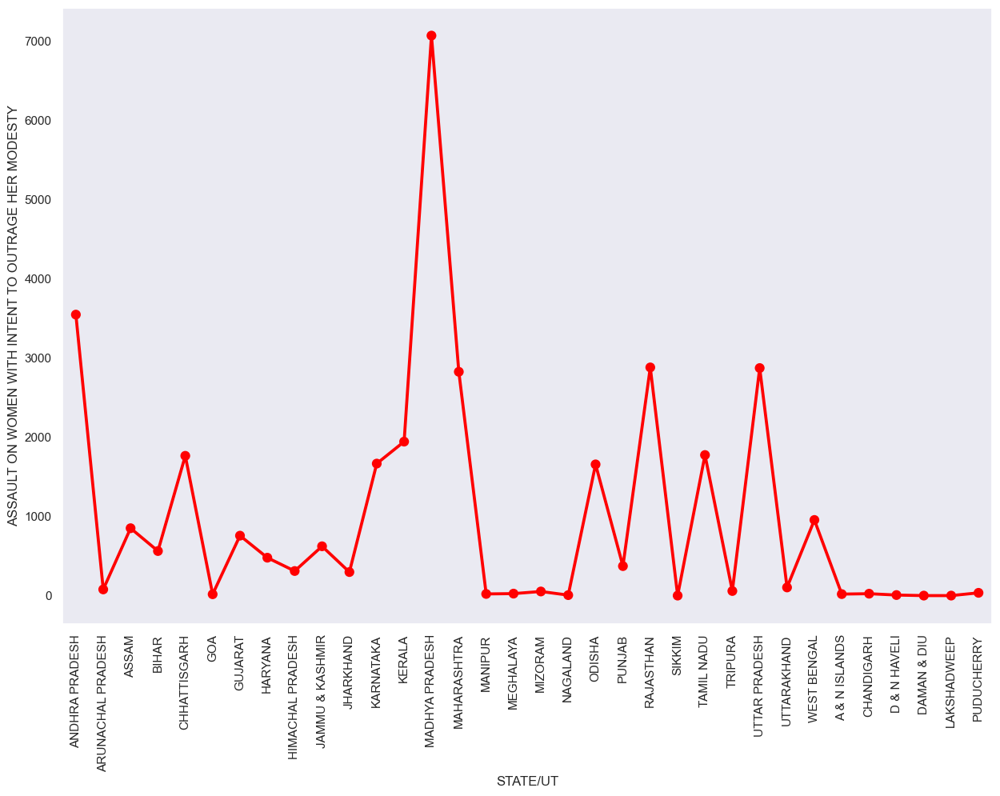

In [120]:
fig, (ax_0) = plt.subplots(figsize=(15,10), nrows=1)
sns.pointplot(data=rate2001, x='STATE/UT', y="ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY", ax=ax_0, color="red");
plt.xticks(rotation=90)


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33]),
 [Text(0, 0, 'ANDHRA PRADESH'),
  Text(1, 0, 'ARUNACHAL PRADESH'),
  Text(2, 0, 'ASSAM'),
  Text(3, 0, 'BIHAR'),
  Text(4, 0, 'CHHATTISGARH'),
  Text(5, 0, 'GOA'),
  Text(6, 0, 'GUJARAT'),
  Text(7, 0, 'HARYANA'),
  Text(8, 0, 'HIMACHAL PRADESH'),
  Text(9, 0, 'JAMMU & KASHMIR'),
  Text(10, 0, 'JHARKHAND'),
  Text(11, 0, 'KARNATAKA'),
  Text(12, 0, 'KERALA'),
  Text(13, 0, 'MADHYA PRADESH'),
  Text(14, 0, 'MAHARASHTRA'),
  Text(15, 0, 'MANIPUR'),
  Text(16, 0, 'MEGHALAYA'),
  Text(17, 0, 'MIZORAM'),
  Text(18, 0, 'NAGALAND'),
  Text(19, 0, 'ODISHA'),
  Text(20, 0, 'PUNJAB'),
  Text(21, 0, 'RAJASTHAN'),
  Text(22, 0, 'SIKKIM'),
  Text(23, 0, 'TAMIL NADU'),
  Text(24, 0, 'TRIPURA'),
  Text(25, 0, 'UTTAR PRADESH'),
  Text(26, 0, 'UTTARAKHAND'),
  Text(27, 0, 'WEST BENGAL'),
  Text(28, 0, 'A & N ISLANDS'),
  Text(29, 0, 'CHANDIGARH'),
  T

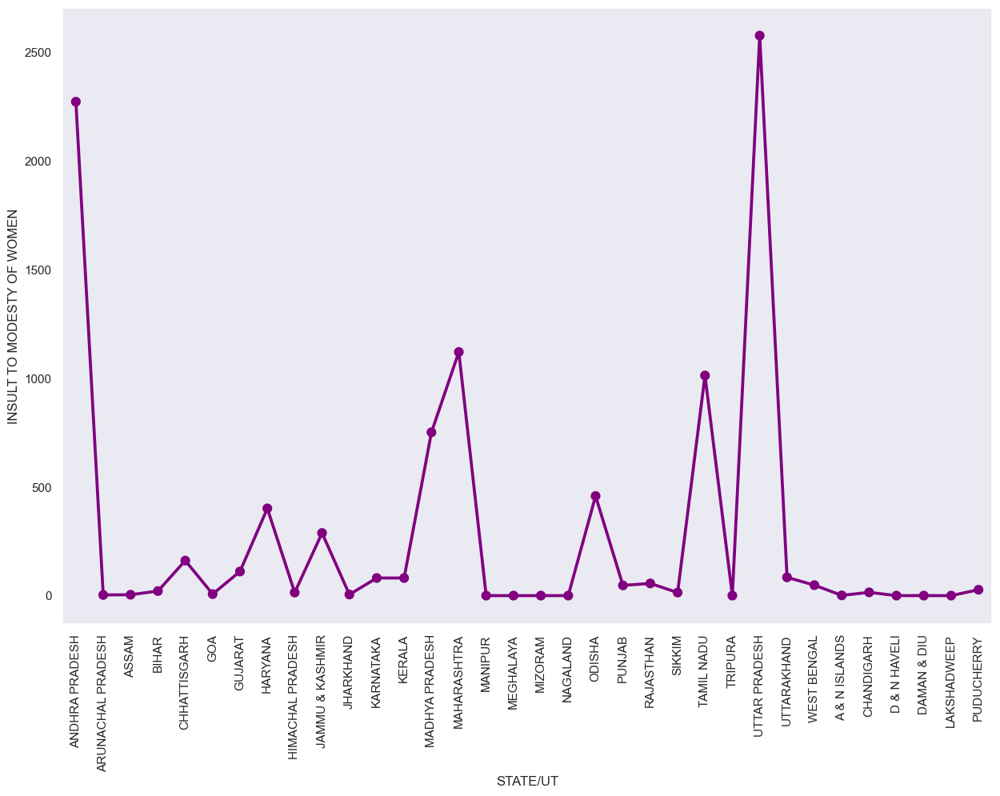

In [121]:
fig, (ax_0) = plt.subplots(figsize=(15,10), nrows=1)

sns.pointplot(data=rate2001, x='STATE/UT', y="INSULT TO MODESTY OF WOMEN", ax=ax_0, color="purple");
plt.xticks(rotation=90)

In [122]:
fig = px.bar(rate2001, x="STATE/UT", y="RIOTS", color_discrete_sequence=["blue"], title="RIOTS crime rates in 2001")
fig.update_layout(xaxis_title = "STATE/UT",
                  yaxis_title = "CRIME RATE")
fig.layout.template ="plotly_dark"
fig.show()

In [123]:
rate2002=df[(df['YEAR']==2002)]
rate2002

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,TOTAL CRIME RATE
34,ANDHRA PRADESH,TOTAL,77710,2002,2525,1644,165,1002,0,1002,...,39839,449,3799,2024,7018,0,8691,36385,143610,1848.024707
35,ARUNACHAL PRADESH,TOTAL,1121,2002,61,38,6,38,0,38,...,401,0,68,2,13,0,0,684,2228,1987.511151
36,ASSAM,TOTAL,27317,2002,1253,479,55,970,0,970,...,4764,70,984,7,1694,0,1957,8575,36346,1330.526778
37,BIHAR,TOTAL,85568,2002,3712,3526,396,1040,0,1040,...,8770,927,621,6,1577,38,2497,39145,94040,1099.008975
38,CHHATTISGARH,TOTAL,21412,2002,844,453,24,992,0,992,...,4484,85,1483,147,653,0,963,17576,37950,1772.370633
39,GOA,TOTAL,1357,2002,30,20,4,12,0,12,...,236,2,18,6,8,0,202,780,2440,1798.084009
40,GUJARAT,TOTAL,52079,2002,1532,759,13,267,0,267,...,13531,62,750,104,3321,0,3258,50612,106675,2048.330421
41,HARYANA,TOTAL,21837,2002,760,487,89,361,1,360,...,4514,256,454,1424,1565,0,955,16854,40152,1838.714109
42,HIMACHAL PRADESH,TOTAL,6203,2002,123,86,6,137,0,137,...,1476,6,326,12,234,0,482,6921,12243,1973.722392
43,JAMMU & KASHMIR,TOTAL,10395,2002,1048,1240,31,192,0,192,...,366,18,785,368,54,0,380,9390,19967,1920.827321


In [124]:
fig = px.bar(rate2002, x="STATE/UT", y="CHEATING", color_discrete_sequence=["blue"], title="CHEATING crime rates in 2002")
fig.update_layout(xaxis_title = "STATE/UT",
                  yaxis_title = "CRIME RATE")
fig.layout.template ="plotly_dark"
fig.show()

In [125]:
fig = px.bar(rate2002, x="STATE/UT", y="CAUSING DEATH BY NEGLIGENCE", color_discrete_sequence=["blue"], title="CAUSING DEATH BY NEGLIGENCE crime rates in 2002")
fig.update_layout(xaxis_title = "STATE/UT",
                  yaxis_title = "CRIME RATE")
fig.layout.template ="plotly_dark"
fig.show()

In [126]:
# top 10 state with crime rate in 2002
def pie_chart_highest(rate2002, nam_feature):
    data= rate2002.sort_values(by=nam_feature, ascending=False)
    fig = px.pie(data[:15], values=nam_feature, names='STATE/UT',
                 title='Top 10 States with the Highest '+nam_feature, 
                 color_discrete_sequence=px.colors.sequential.Purp_r)
    fig.show()
pie_chart_highest(rate2002, 'MURDER')

In [127]:
pie_chart_highest(rate2002, 'BURGLARY')

In [128]:
rate2006=df[(df['YEAR']==2006)]
rate2006

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,TOTAL CRIME RATE
170,ANDHRA PRADESH,TOTAL,81219,2006,2766,1860,123,1049,1,1048,...,47946,519,4534,2411,9164,0,11489,43722,173909,2141.235425
171,ARUNACHAL PRADESH,TOTAL,1178,2006,60,33,3,37,0,37,...,415,1,63,2,14,0,82,565,2294,1947.368421
172,ASSAM,TOTAL,28896,2006,1207,414,32,1244,0,1244,...,5290,105,1290,10,2548,0,3022,10444,43673,1511.385659
173,BIHAR,TOTAL,91631,2006,3249,3303,326,1232,0,1232,...,12674,1188,530,53,1689,42,2860,39941,100665,1098.591088
174,CHHATTISGARH,TOTAL,22797,2006,1098,825,15,995,0,995,...,6722,103,1598,143,717,1,2239,19246,45177,1981.708119
175,GOA,TOTAL,1517,2006,39,17,1,21,0,21,...,170,0,18,7,14,0,233,698,2204,1452.867502
176,GUJARAT,TOTAL,55475,2006,1165,471,24,354,0,354,...,10685,50,736,138,4977,0,4339,66802,120972,2180.657954
177,HARYANA,TOTAL,23569,2006,873,585,59,608,0,608,...,5135,255,486,491,2254,0,1350,19014,50509,2143.026857
178,HIMACHAL PRADESH,TOTAL,6498,2006,111,78,20,113,0,113,...,1261,3,275,31,259,0,499,7760,13093,2014.927670
179,JAMMU & KASHMIR,TOTAL,11035,2006,487,854,40,250,0,250,...,376,10,960,347,135,0,222,10886,20787,1883.733575


In [129]:
def pie_chart_highest(rate2006, nam_feature):
    data= rate2006.sort_values(by=nam_feature, ascending=False)
    fig = px.pie(data[:15], values=nam_feature, names='STATE/UT',
                 title='Top 10 States with the Highest '+nam_feature, 
                 color_discrete_sequence=px.colors.sequential.Purp_r)
    fig.show()
pie_chart_highest(rate2006, 'MURDER')

In [130]:
pie_chart_highest(rate2006, 'KIDNAPPING & ABDUCTION')

In [131]:
pie_chart_highest(rate2006, 'DACOITY')

In [132]:
rate2008=df[(df['YEAR']==2008)]
rate2008

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,TOTAL CRIME RATE
238,ANDHRA PRADESH,TOTAL,82858,2008,2690,1942,165,1257,0,1257,...,48167,556,4730,3551,10306,0,12861,43929,179275,2163.641411
239,ARUNACHAL PRADESH,TOTAL,1206,2008,72,37,2,42,0,42,...,479,0,72,1,13,0,104,590,2374,1968.490879
240,ASSAM,TOTAL,29660,2008,1426,417,71,1438,0,1438,...,6107,103,1272,2,3478,0,2259,17598,53333,1798.145651
241,BIHAR,TOTAL,94474,2008,3139,2954,386,1302,0,1302,...,16644,1210,999,21,1992,22,4592,54370,122669,1298.441899
242,CHHATTISGARH,TOTAL,23466,2008,1169,736,18,978,0,978,...,8565,106,1621,125,897,0,2800,21074,51442,2192.192960
243,GOA,TOTAL,1629,2008,49,25,11,30,0,30,...,185,2,32,12,12,0,230,886,2742,1683.241252
244,GUJARAT,TOTAL,57109,2008,1106,487,35,374,0,374,...,10897,27,828,122,6094,0,4934,65525,123808,2167.924495
245,HARYANA,TOTAL,24425,2008,921,616,92,631,0,631,...,4504,302,435,605,2435,0,1323,21460,55344,2265.875128
246,HIMACHAL PRADESH,TOTAL,6636,2008,129,59,5,157,0,157,...,1258,3,295,41,343,0,485,7837,13976,2106.088005
247,JAMMU & KASHMIR,TOTAL,11350,2008,237,570,31,219,0,219,...,273,21,935,296,162,0,293,10734,20604,1815.330396


In [133]:
def pie_chart_highest(rate2008, nam_feature):
    data= rate2008.sort_values(by=nam_feature, ascending=False)
    fig = px.pie(data[:15], values=nam_feature, names='STATE/UT',
                 title='Top 15 States with the Highest '+nam_feature, 
                 color_discrete_sequence=px.colors.sequential.Purp_r)
    fig.show()
pie_chart_highest(rate2008, 'MURDER')

In [134]:
pie_chart_highest(rate2008, 'KIDNAPPING & ABDUCTION')

In [135]:
pie_chart_highest(rate2008, 'RAPE')

In [136]:
rate2010=df[(df['YEAR']==2010)]
rate2010

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,TOTAL CRIME RATE
306,ANDHRA PRADESH,TOTAL,84426,2010,2538,1953,155,1362,0,1362,...,46777,588,4634,4562,12080,0,14085,41373,181438,2149.077298
307,ARUNACHAL PRADESH,TOTAL,1235,2010,75,34,3,47,0,47,...,439,0,84,1,12,0,106,622,2439,1974.898785
308,ASSAM,TOTAL,30413,2010,1223,431,46,1721,5,1716,...,5744,175,1400,20,5410,0,2847,22110,61668,2027.685529
309,BIHAR,TOTAL,97192,2010,3362,2915,344,795,0,795,...,15328,1257,534,16,2271,8,5615,56508,127453,1311.352786
310,CHHATTISGARH,TOTAL,24124,2010,1065,756,30,1012,0,1012,...,10188,115,1706,182,861,2,2907,23091,54958,2278.146244
311,GOA,TOTAL,1749,2010,35,27,3,36,0,36,...,177,1,36,16,17,0,256,927,3293,1882.790166
312,GUJARAT,TOTAL,58702,2010,1048,462,44,408,0,408,...,10131,19,668,110,5600,0,5907,63788,116439,1983.561037
313,HARYANA,TOTAL,25270,2010,1005,836,63,720,0,720,...,3733,284,476,580,2720,0,1595,20060,59120,2339.533043
314,HIMACHAL PRADESH,TOTAL,6767,2010,132,74,12,160,0,160,...,1374,2,350,78,275,0,610,7020,13049,1928.328654
315,JAMMU & KASHMIR,TOTAL,11659,2010,217,711,26,245,0,245,...,278,9,1038,262,211,0,494,11869,23223,1991.851788


In [137]:
def pie_chart_highest(rate2010, nam_feature):
    data= rate2010.sort_values(by=nam_feature, ascending=False)
    fig = px.pie(data[:15], values=nam_feature, names='STATE/UT',
                 title='Top 15 States with the Highest '+nam_feature, 
                 color_discrete_sequence=px.colors.sequential.Purp_r)
    fig.show()
pie_chart_highest(rate2010, 'MURDER')

In [138]:
pie_chart_highest(rate2010, 'KIDNAPPING & ABDUCTION')

In [139]:
pie_chart_highest(rate2010, 'RAPE')

In [140]:
rate2011=df[(df['YEAR']==2011)]
rate2011

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,TOTAL CRIME RATE
340,ANDHRA PRADESH,TOTAL,85188,2011,2808,2229,171,1442,0,1442,...,54452,599,4849,3658,13376,0,13973,38392,189780,2227.778560
341,ARUNACHAL PRADESH,TOTAL,1249,2011,65,29,2,42,0,42,...,379,0,51,0,18,0,98,622,2286,1830.264211
342,ASSAM,TOTAL,30791,2011,1303,504,48,1700,0,1700,...,6306,121,1193,8,5246,2,2915,25513,66714,2166.672080
343,BIHAR,TOTAL,98505,2011,3198,3327,348,934,1,933,...,19391,1413,790,11,2607,10,5877,55705,135896,1379.584793
344,CHHATTISGARH,TOTAL,24452,2011,1110,747,28,1053,0,1053,...,11105,104,1654,174,834,2,2856,25223,57218,2340.013087
345,GOA,TOTAL,1799,2011,48,22,6,29,0,29,...,215,1,29,12,18,0,263,1001,3449,1917.176209
346,GUJARAT,TOTAL,59485,2011,1126,478,43,439,0,439,...,10159,30,685,93,6052,0,5827,69788,123371,2073.985038
347,HARYANA,TOTAL,25686,2011,1062,851,60,733,0,733,...,3423,255,474,490,2740,0,1505,20549,60741,2364.751226
348,HIMACHAL PRADESH,TOTAL,6831,2011,130,50,6,168,0,168,...,1251,4,331,62,239,0,563,8102,14312,2095.154443
349,JAMMU & KASHMIR,TOTAL,11806,2011,169,494,29,277,0,277,...,246,11,1194,350,286,0,385,13257,24504,2075.554803


In [141]:
def pie_chart_highest(rate2011, nam_feature):
    data= rate2011.sort_values(by=nam_feature, ascending=False)
    fig = px.pie(data[:15], values=nam_feature, names='STATE/UT',
                 title='Top 15 States with the Highest '+nam_feature, 
                 color_discrete_sequence=px.colors.sequential.Purp_r)
    fig.show()
pie_chart_highest(rate2011, 'MURDER')

In [142]:
pie_chart_highest(rate2011, 'KIDNAPPING & ABDUCTION')

In [143]:
pie_chart_highest(rate2011, 'RAPE')

MURDER,RAPE,KIDNAPPING & ABDUCTION reported crimes in each state.
Above pie charts showing top 15 state with crime rate of murders,rapes,kidnapping cases reported in year 2011,2010,2006. 

In [144]:
cr = pd.DataFrame(df.groupby(["STATE/UT", "YEAR"])['MURDER', 'RAPE','KIDNAPPING & ABDUCTION'].sum().reset_index())
cr.head()

,STATE/UT,YEAR,MURDER,RAPE,KIDNAPPING & ABDUCTION
0,A & N ISLANDS,2001,13,3,2
1,A & N ISLANDS,2002,17,2,2
2,A & N ISLANDS,2003,21,2,2
3,A & N ISLANDS,2004,15,10,3
4,A & N ISLANDS,2005,14,4,2


In [145]:
ra = pd.DataFrame(df.groupby(["STATE/UT", "YEAR"])['TOTAL CRIME RATE'].sum().reset_index())
ra.head()

,STATE/UT,YEAR,TOTAL CRIME RATE
0,A & N ISLANDS,2001,1832.869081
1,A & N ISLANDS,2002,1634.408602
2,A & N ISLANDS,2003,1672.727273
3,A & N ISLANDS,2004,1874.686717
4,A & N ISLANDS,2005,1651.331719


total crime rate of every year in every state.

# Crime rate over year(2001-2011)

In [146]:
total_crime_rate = pd.DataFrame(df.groupby(["YEAR"])["TOTAL CRIME RATE"].
                           sum().reset_index())

In [147]:
total_sorted_rate = total_crime_rate.sort_values("TOTAL CRIME RATE", ascending=False)


In [148]:
fig = px.bar(data_frame=total_sorted_rate, x="TOTAL CRIME RATE", y="YEAR", orientation='h', color_discrete_sequence=["red"]);
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.show()

# Crime Rate in top 30 State

In [149]:
state_crime_rate = pd.DataFrame(df.groupby(["STATE/UT"])["TOTAL CRIME RATE"].
                           sum().reset_index())

In [150]:
state_sorted_rate = state_crime_rate.sort_values("TOTAL CRIME RATE", ascending=False)[:30]


In [151]:
fig = px.bar(data_frame=state_sorted_rate, x="TOTAL CRIME RATE", y="STATE/UT", orientation='h', color_discrete_sequence=["blue"]);
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.show()

# Correlation between  features

In [152]:
cor = df.corr()
cor

,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,TOTAL CRIME RATE
POPULATION,1.000000,0.035739,0.945690,0.894819,0.799212,0.719137,0.117608,0.719123,0.846451,0.802217,...,0.649295,0.879788,0.632587,0.627685,0.719346,0.239953,0.782696,0.689709,0.829592,-0.028291
YEAR,0.035739,1.000000,-0.014401,0.005181,0.006051,0.108003,0.020548,0.107999,0.163180,0.203777,...,0.023851,0.053164,0.058168,-0.006371,0.162146,-0.041523,0.139758,0.087307,0.082852,0.041848
MURDER,0.945690,-0.014401,1.000000,0.951560,0.765011,0.721895,0.148453,0.721863,0.813918,0.731403,...,0.615163,0.901954,0.603535,0.643067,0.608175,0.326195,0.712104,0.613889,0.762967,-0.070857
ATTEMPT TO MURDER,0.894819,0.005181,0.951560,1.000000,0.741271,0.686891,0.108036,0.686880,0.801622,0.721920,...,0.591835,0.905638,0.601970,0.586205,0.539008,0.312286,0.681080,0.663340,0.754718,-0.009701
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,0.799212,0.006051,0.765011,0.741271,1.000000,0.466175,0.051874,0.466180,0.724555,0.708669,...,0.195601,0.853797,0.296270,0.528636,0.471635,0.131931,0.403978,0.304610,0.407389,-0.204890
RAPE,0.719137,0.108003,0.721895,0.686891,0.466175,1.000000,0.130401,1.000000,0.652429,0.634023,...,0.674181,0.657377,0.854338,0.401107,0.685749,0.242180,0.611113,0.692840,0.780190,0.139817
CUSTODIAL RAPE,0.117608,0.020548,0.148453,0.108036,0.051874,0.130401,1.000000,0.129815,0.164079,0.148889,...,0.107560,0.113994,0.070722,0.046372,0.086177,0.010790,0.109444,0.084396,0.112255,0.001470
OTHER RAPE,0.719123,0.107999,0.721863,0.686880,0.466180,1.000000,0.129815,1.000000,0.652381,0.633983,...,0.674169,0.657360,0.854362,0.401111,0.685751,0.242192,0.611096,0.692843,0.780184,0.139827
KIDNAPPING & ABDUCTION,0.846451,0.163180,0.813918,0.801622,0.724555,0.652429,0.164079,0.652381,1.000000,0.975214,...,0.454084,0.844257,0.457503,0.420991,0.697450,0.248308,0.667263,0.546678,0.661899,-0.065883
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,0.802217,0.203777,0.731403,0.721920,0.708669,0.634023,0.148889,0.633983,0.975214,1.000000,...,0.415501,0.783552,0.456199,0.399923,0.706474,0.103475,0.669559,0.525500,0.630870,-0.045293


*Values close to 1 indicate a strong positive correlation.
*Values close to -1 indicate a strong negative correlation.
*Values close to 0 indicate a weak or no correlation.
1.population has a positive correlation of 0.8 with TotalIPC crimes.
2.this suggest that states with larger population tend to have higher totalIPC crimes.
3.year and'various crime':this suggest that there is no strong linear relationship between Year and specific types of crimes.
4.Total IPC crimes includes all types of crimes, and therefore,it correlates stongly with the sum of specific crimes types.

================================================================================

In [153]:
maha = data[(data['STATE/UT']=='ANDHRA PRADESH')]
maha

,STATE/UT,DISTRICT,POPULATION,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,TOTAL,76542,2001,2602,1555,136,871,0,871,...,872,34947,420,3544,2271,5791,7,7400,34344,130089
34,ANDHRA PRADESH,TOTAL,77710,2002,2525,1644,165,1002,0,1002,...,991,39839,449,3799,2024,7018,0,8691,36385,143610
68,ANDHRA PRADESH,TOTAL,78616,2003,2667,1678,147,946,0,946,...,1049,41545,466,4128,2286,8167,5,8515,39242,156951
102,ANDHRA PRADESH,TOTAL,79502,2004,2579,1908,163,1016,0,1016,...,915,43335,512,3817,2310,8388,2,11452,36460,158756
136,ANDHRA PRADESH,TOTAL,80369,2005,2750,1724,111,935,1,934,...,967,42179,443,3595,2508,8696,3,9973,37707,157123
170,ANDHRA PRADESH,TOTAL,81219,2006,2766,1860,123,1049,1,1048,...,1012,47946,519,4534,2411,9164,0,11489,43722,173909
204,ANDHRA PRADESH,TOTAL,82049,2007,2665,1885,135,1070,0,1070,...,1176,46122,613,4406,3316,11335,0,12629,43586,175087
238,ANDHRA PRADESH,TOTAL,82858,2008,2690,1942,165,1257,0,1257,...,1021,48167,556,4730,3551,10306,0,12861,43929,179275
272,ANDHRA PRADESH,TOTAL,83649,2009,2449,1859,134,1188,0,1188,...,1039,44488,546,5147,3520,11297,0,13438,48087,180441
306,ANDHRA PRADESH,TOTAL,84426,2010,2538,1953,155,1362,0,1362,...,925,46777,588,4634,4562,12080,0,14085,41373,181438


# 2.6.Each State Crime Report

I create report in seperate file. filename:ds-capstoneProject-phase2(Report)